In [1]:
from scipy.stats import chi2_contingency
from cellrank.estimators import GPCCA
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt
import matplotlib.collections as collections 
import scanpy.external as sce
import scrublet as scr
import cellrank as cr
import seaborn as sns
import scvelo as scv
import scanpy as sc
import pandas as pd
import numpy as np
import collections
import matplotlib
#import pyscenic
#import networkx
import anndata
#import network 
#import fsspec
#import igrap
import scvi
import desc
import umap
import sys
import h5py
import os
import re


#%load_ext rpy2.ipython
%matplotlib inline 


sc.settings.verbosity = 3     


# Setting the seed 
np.random.seed(42)


# Setting the figure parameters
sc.set_figure_params(figsize=(2.2, 2.2), format = 'svg', dpi_save = 300)


Global seed set to 0
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


reading /Users/brendamelano/Desktop/Reprogramming_Osteosarcoma/Lineage_Tracing/OS052/filtered_feature_bc_matrix.h5
 (0:00:00)


/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


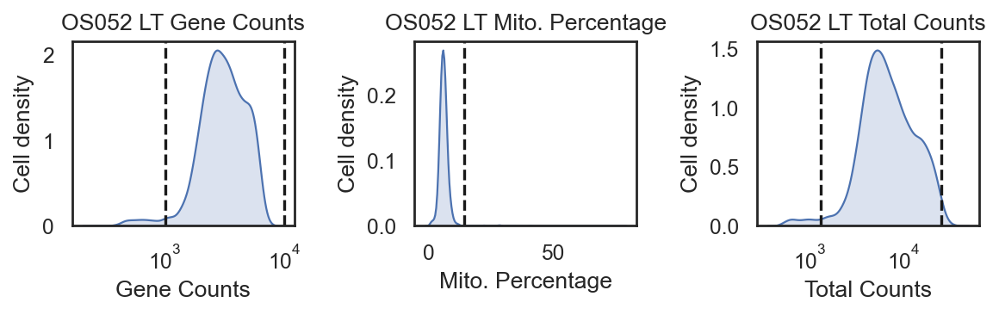

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scipy/sparse/_sputils.py:44: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  upcast = np.find_common_type(args, [])
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvelo/preprocessing/utils.py:554: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["gene_count_corr"] = np.round(


Normalized count data: X.
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/var/folders/lt/nhcx288j6jjfg45n3bhh1mjh0000gn/T/ipykernel_56382/3045779579.py:91: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  scv.pp.log1p(adata)
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    301 total control genes are used. (0:00:00)
computing score 'G2M_score'


/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scipy/sparse/_sputils.py:44: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  upcast = np.find_common_type(args, [])


    finished: added
    'G2M_score', score of gene set (adata.obs).
    253 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


In [2]:
# Reading in H5 file
adata = sc.read_10x_h5('/Users/brendamelano/Desktop/Reprogramming_Osteosarcoma/Lineage_Tracing/OS052/filtered_feature_bc_matrix.h5')


# Making the var names unique
adata.var_names_make_unique()


# Filtering as is done in Seurat
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'


# Computing mitochondrial percentage
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)



###


# Data for the variables
variables = [
    ('n_genes_by_counts', [(1000, '--'), (10000, '--')]),
    ('pct_counts_mt', [(14, '--')]),
    ('total_counts', [(1300, '--'), (25000, '--')])
]


# Dictionary for new titles
titles = {
    'n_genes_by_counts': 'Gene Counts',
    'pct_counts_mt': 'Mito. Percentage',
    'total_counts': 'Total Counts'
}


# Setting the theme without gridlines
sns.set_theme(style="white")


# Create a figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(7.5, 2.5))


# Iterate over the variables and their respective lines to plot
for ax, (var, lines) in zip(axes, variables):
    sns.kdeplot(data=adata.obs, x=var, fill=True, alpha=0.2, ax=ax,
                log_scale=True if var != 'pct_counts_mt' else False)
    for line, style in lines:
        ax.axvline(x=line, color='k', linestyle=style)
    ax.set_title(f"OS052 LT {titles[var]}")  # Simpler title without extra text
    ax.set_xlabel(titles[var])  # Optionally keep the x-label as the new title
    ax.set_ylabel("Cell density")


# Adjust layout to prevent overlap
plt.tight_layout()


# Save the figure as SVG
plt.savefig("/Users/brendamelano/Desktop/OS052_LT_filtering.svg")


# Show the plot
plt.show()


###



# Filtering the adata set based on total counts, genes and mitochondrial percentage
adata = adata[(adata.obs['total_counts'] <= 25000) &
              (adata.obs['total_counts'] >= 1300) &
                (adata.obs['n_genes_by_counts'] >= 1000) &
                (adata.obs['n_genes_by_counts'] < 10000) & #pct_counts_mt
                (adata.obs['pct_counts_mt'] < 14)
                ]


# Normalizing the cells by all counts across all the genes
scv.pp.normalize_per_cell(adata)


# filtering the dataset to only keep the most variable genes
# this is redundant to selecting highly variable genes
#scv.pp.filter_genes_dispersion(adata, n_top_genes=1500)
# ppreviously 3000

# Make sure that the log transformation is where it belongs in this preprocessing sequence
scv.pp.log1p(adata)


# preserving the counts
adata.layers["counts"] = adata.X.copy() 


# freezing the data in raw
adata.raw = adata


# creating a df with the indexes (CellIDs from the adata object)
sample_one_index = pd.DataFrame(adata.obs.index)


# Selecting highly variable genes
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=3000, # previously 1500
    subset=True,
    layer="counts"
)


#genes = adata.var.index.values

# reading in cell cycle genes in case I want to regress on that
cell_cycle_genes = [x.strip() for x in open('/Users/brendamelano/Desktop/scvi/regev_lab_cell_cycle_genes.txt')]


# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]


# Keeping only the cell cycle genes within the adata object
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]


sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)


# Computing the ccdifference scores
adata.obs['ccdifference'] = adata.obs['S_score'] - adata.obs['G2M_score']


# Linear dimensionality reduction
#sc.pp.normalize_total(adata, target_sum=1e4)
#sc.pp.log1p(adata)
#sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
#adata.raw = adata

# Filtering the anndata object based on highly variable genes
adata = adata[:, adata.var.highly_variable]



In [3]:

sc.pp.regress_out(adata, ['n_counts', 'pct_counts_mt', 'ccdifference'])
sc.pp.scale(adata, max_value=10)

# Computing principal components
sc.tl.pca(adata, svd_solver='arpack') #vary principal component number

# Computing neighbors
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=15)

# 
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution = 0.35)

sc.pl.umap(
    adata,
    color=["leiden"],
    frameon= True,
    title = "OS052 LT Clusters",
    size = 20,
    #save="OS052_LT_Clusters.svg"
)

regressing out ['n_counts', 'pct_counts_mt', 'ccdifference']
    sparse input is densified and may lead to high memory use


/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:2167: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  dtyp = np.find_common_type([x.dtype, np.float6

    finished (0:00:14)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


# Reading in state labeled data

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


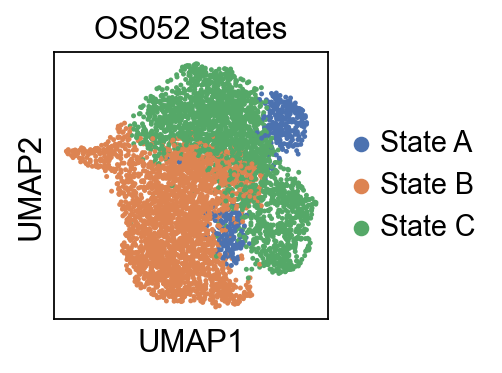

In [4]:
# Reading in the adata file from the subtype data
adata = scv.read("/Users/brendamelano/Desktop/Reprogramming_Osteosarcoma/Lineage_Tracing/scRNAseq_LT_analysis/OS052/OS052_adata_states_PCA.h5ad")


# Plot the UMAP
sc.pl.umap(
    adata,
    color=["State"],
    frameon=True,
    title="OS052 States",
    size=20,
    show=False  # Do not display the plot immediately
)


# Rasterize the scatter plot elements only
ax = plt.gca()
for artist in ax.get_children():
    if isinstance(artist, collections.PathCollection):  # Use the correct module path
        artist.set_rasterized(True)

        
# Save as an SVG with rasterized points
#plt.savefig("/Users/brendamelano/Desktop/OS052_LT_clusters_rasterized.svg", format='svg')
plt.show()

# State module enrichment

computing score 'State_A_score'
    finished: added
    'State_A_score', score of gene set (adata.obs).
    50 total control genes are used. (0:00:00)
computing score 'Subtype_B_score'
    finished: added
    'Subtype_B_score', score of gene set (adata.obs).
    249 total control genes are used. (0:00:00)
computing score 'Subtype_C_score'
    finished: added
    'Subtype_C_score', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)


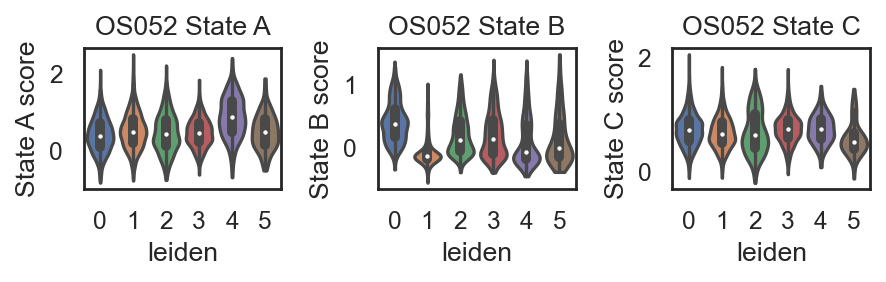

In [5]:
# Reading in gene lists for GSEA
Subtype_A_genes = [x.strip() for x in open('/Users/brendamelano/Desktop/gmt_files/Subtype_A_module.csv')]
Subtype_B_genes = [x.strip() for x in open('/Users/brendamelano/Desktop/gmt_files/Subtype_B_module.csv')]
Subtype_C_genes = [x.strip() for x in open('/Users/brendamelano/Desktop/gmt_files/Subtype_C_module.csv')]


# Keeping only genes that appear in the adata
Subtype_A_genes = [x for x in Subtype_A_genes if x in adata.var_names]
Subtype_B_genes = [x for x in Subtype_B_genes if x in adata.var_names]
Subtype_C_genes = [x for x in Subtype_C_genes if x in adata.var_names]


# Computing GSEA scores
sc.tl.score_genes(adata, Subtype_A_genes, ctrl_size=50, gene_pool=None, n_bins=25, 
                  score_name='State_A_score', random_state=0, copy=False, use_raw=None)
sc.tl.score_genes(adata, Subtype_B_genes, ctrl_size=50, gene_pool=None, n_bins=25, 
                  score_name='Subtype_B_score', random_state=0, copy=False, use_raw=None)
sc.tl.score_genes(adata, Subtype_C_genes, ctrl_size=50, gene_pool=None, n_bins=25, 
                  score_name='Subtype_C_score', random_state=0, copy=False, use_raw=None)


# Plotting the results
fig, axs = plt.subplots(1, 3, figsize=(5.7, 1.9))

sc.pl.violin(adata, ['State_A_score'], groupby='leiden', stripplot=False, inner='box', 
             ylabel='State A score', ax=axs[0], show=False)

axs[0].set_title('OS052 State A')

sc.pl.violin(adata, ['Subtype_B_score'], groupby='leiden', stripplot=False, inner='box', 
             ylabel='State B score', ax=axs[1], show=False)
axs[1].set_title('OS052 State B')

sc.pl.violin(adata, ['Subtype_C_score'], groupby='leiden', stripplot=False, inner='box', 
             ylabel='State C score', ax=axs[2], show=False)
axs[2].set_title('OS052 State C')

plt.tight_layout()


# Saving the figure onto the desktop
#plt.savefig('/Users/brendamelano/Desktop/OS152_gsea_scores.svg', format='svg')
plt.show()

# State module markers by cluster

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/var/folders/lt/nhcx288j6jjfg45n3bhh1mjh0000gn/T/ipykernel_56382/3060089365.py:47: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata_subset.var['subtype_order'] = adata_

<Figure size 1200x300 with 0 Axes>

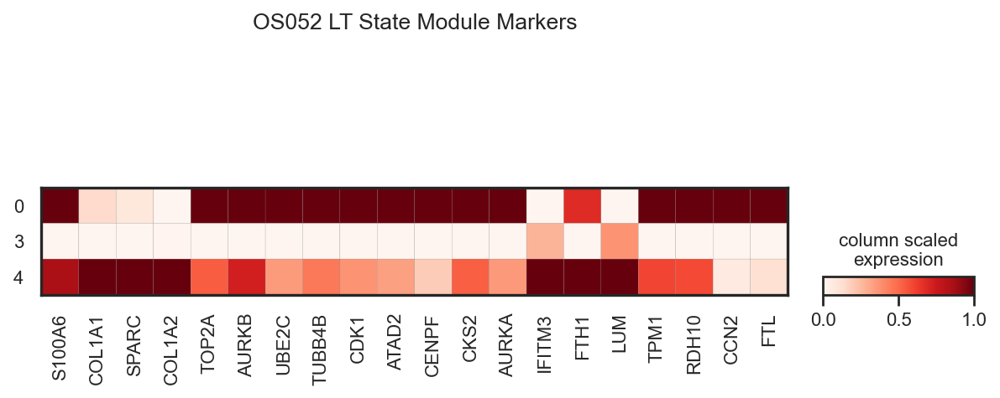

In [6]:
# Read gene lists for each subtype from the CSV files
def read_genes(file_path):
    with open(file_path, 'r') as file:
        genes = [x.strip() for x in file]
    return genes


# Reading in the subtype gene modules
Subtype_A_genes = read_genes('/Users/brendamelano/Desktop/gmt_files/Subtype_A_module.csv')
Subtype_B_genes = read_genes('/Users/brendamelano/Desktop/gmt_files/Subtype_B_module.csv')
Subtype_C_genes = read_genes('/Users/brendamelano/Desktop/gmt_files/Subtype_C_module.csv')


# Specified markers for visualization
specified_genes = ['UBE2C', 'AURKA', 'CENPF', 'AURKB', 'CKS2', 'TOP2A', 'CDK1', 'TUBB4B', 'ATAD2', 'H2AX']

# Ensure these genes are in the adata object
reduced_state_B_genes = [gene for gene in specified_genes if gene in adata.var_names]

plt.rcParams.update({'font.size': 12})

# Combine gene lists from all subtypes, ensuring uniqueness if necessary
combined_genes = list(set(Subtype_A_genes + reduced_state_B_genes + Subtype_C_genes))


# Keeping only genes that appear in the adata object
combined_genes = [gene for gene in combined_genes if gene in adata.var_names]


# Ensure the combined_genes are in your expression data
adata_subset = adata[:, adata.var_names.isin(combined_genes)]


# Create the subtype dictionary 
subtype_A_dict = {gene: 'A' for gene in Subtype_A_genes}
subtype_B_dict = {gene: 'B' for gene in reduced_state_B_genes}
subtype_C_dict = {gene: 'C' for gene in Subtype_C_genes}
subtype_dict = {**subtype_A_dict, **subtype_B_dict, **subtype_C_dict}


# Annotate the genes in adata with their subtype
adata.var['State'] = [subtype_dict.get(gene, 'Unknown') for gene in adata.var_names]


# Sort the genes in your subset by subtype
adata_subset = adata[:, adata.var_names.isin(combined_genes)]
adata_subset.var['subtype_order'] = adata_subset.var['State'].map({'A': 1, 'B': 2, 'C': 3, 'Unknown': 4})
adata_subset = adata_subset[:, adata_subset.var['subtype_order'].argsort()]


# Create a list of genes sorted by subtype for use in the matrixplot
sorted_genes_by_subtype = adata_subset.var_names.tolist()


# Create a figure explicitly
plt.figure(figsize=(2, 0.5), dpi=600) 


ax = sc.pl.matrixplot(
    adata_subset,
    var_names=sorted_genes_by_subtype,  # Use the sorted list of genes
    groupby='leiden',
    cmap="Reds",
    standard_scale="var",
    colorbar_title="column scaled\nexpression",
    title="OS052 LT State Module Markers",
    show=False
)


# Save the figure using matplotlib's savefig with explicit format setting
#plt.savefig("/Users/brendamelano/Desktop/OS052_state_markers_by_cluster_LT.svg", format='svg')

plt.show()

plt.close()

# State Assignments

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


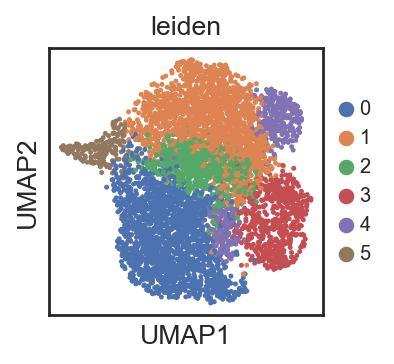

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html 

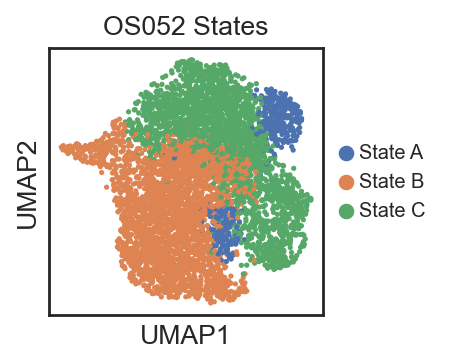

In [5]:
# Generating umap to visualize clusters
sc.pl.umap(adata, 
           color=['leiden'], 
           legend_fontsize=9, 
           size = 20)


adata.obs['leiden'] = adata.obs['leiden'].astype('category')


adata.obs['leiden'][adata.obs['leiden']=='1']='3'
adata.obs['leiden'][adata.obs['leiden']=='2']='0'
adata.obs['leiden'][adata.obs['leiden']=='5']='0'



# adding labels for trajectory subtype
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = { 'State A': ['4'],  'State B': ['0'], 'State C':['3']}


# Initialize empty column in cell metadata
adata.obs['State'] = np.nan


# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata.obs.leiden).isin(cell_dict[i])
    adata.obs.loc[ind,'State'] = i

    
# Creating a dataframe with the cluster IDs
subtypes = pd.DataFrame(adata.obs['State'].values)


# Define the number of clusters
n_subtypes = len(subtypes[0].unique())


# Define a color palette with a limited number of colors
colors = sns.color_palette('pastel', n_subtypes)


sc.pl.umap(adata, color=['State'], 
           legend_fontsize=9, 
           title = "OS052 States") #, palette = subtype_colors


# saving the adata file with the cluster ids
adata.write("/Users/brendamelano/Desktop/Reprogramming_Osteosarcoma/Lineage_Tracing/scRNAseq_LT_analysis/OS052/OS052_adata_states_PCA.h5ad")


# GSEA

In [16]:
# Define the directory for the gmt files
directory = '/Users/brendamelano/Desktop/gmt_files'


# Create a dictionary to store gene lists
gene_lists = {}


# Load gene lists from files
for filename in os.listdir(directory):
    if filename.endswith('.txt'):
        variable_name = os.path.splitext(filename)[0].upper()
        variable_name += "_genes"
        with open(os.path.join(directory, filename)) as f:
            gene_lists[variable_name] = [line.strip() for line in f]

            
# Create a dictionary to store gene scores for each module
gene_scores = {}


# Quantify enrichment for each gene list
for gene_list_name, gene_list in gene_lists.items():
    scores_key = gene_list_name + "_score"
    try:
        sc.tl.score_genes(
            adata, gene_list, ctrl_size=50, gene_pool=None,
            n_bins=5, score_name=scores_key, random_state=0, 
            copy=False, use_raw=None
        )
    except KeyError:
        continue

        
# Define the score names
scores = [ 'GCNP_genes_score', 'CSR_genes_score',   
           'LEF1_genes_score', 'ESC_genes_score', 
          'TNFA_genes_score',
           'PDGF_ERK1_DOWN_genes_score', 'KRAS_genes_score', 'TGFB_genes_score',
           'IL2_genes_score', 'FOCAL_ADHESION_PI3KAKTMTOR_genes_score', 
           'STK33_genes_score']

# Plotting the pathway matrix plot based on subtype
axes_dict = sc.pl.matrixplot(
    adata,
    scores,
    "leiden",
    dendrogram=False,
    cmap="Blues",
    standard_scale="var",
    colorbar_title="column scaled\nexpression",
    show=False  # Prevents the plot from showing immediately
)


# Modify the x-axis and y-axis labels
for ax in axes_dict.values():
    # Update x-axis labels
    labels = [label.get_text().replace('_genes_score', '').replace('_', ' ') for label in ax.get_xticklabels()]
    ax.set_xticklabels(labels, rotation=45, ha='right')
    
    # Set the y-axis labels to the cluster names
    cluster_labels = [f'Cluster {label.get_text()}' for label in ax.get_yticklabels()]
    ax.set_yticklabels(cluster_labels, fontsize=10)  # Adjust font size if needed

    # Add a title to the plot
    ax.set_title('OS052 LT Pathways', fontsize=12)

    
# Save the figure
plt.gcf().savefig('/Users/brendamelano/Desktop/OS052_Pathways_with_Clusters.svg', format='svg')  # Adjust path as needed

# Show the plot if desired
plt.show()


computing score 'IL2_genes_score'
    finished: added
    'IL2_genes_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score 'MTOR_genes_score'
    finished: added
    'MTOR_genes_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score 'FOCAL_ADHESION_PI3KAKTMTOR_genes_score'
    finished: added
    'FOCAL_ADHESION_PI3KAKTMTOR_genes_score', score of gene set (adata.obs).
    196 total control genes are used. (0:00:00)
computing score 'PDGF_ERK1_DOWN_genes_score'
    finished: added
    'PDGF_ERK1_DOWN_genes_score', score of gene set (adata.obs).
    149 total control genes are used. (0:00:00)
computing score 'TNFA_genes_score'


    finished: added
    'TNFA_genes_score', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'GCNP_genes_score'
    finished: added
    'GCNP_genes_score', score of gene set (adata.obs).
    198 total control genes are used. (0:00:00)
computing score 'CSR_genes_score'
    finished: added
    'CSR_genes_score', score of gene set (adata.obs).
    198 total control genes are used. (0:00:00)
computing score 'ESC_genes_score'
    finished: added
    'ESC_genes_score', score of gene set (adata.obs).
    199 total control genes are used. (0:00:00)
computing score 'PI3KAKTMTOR_genes_score'


ValueError: No valid genes were passed for scoring.

# Quantifying doublets

In [9]:
scrub = scr.Scrublet(adata.raw.X)

out = scrub.scrub_doublets(verbose=False, n_prin_comps = 20)

adata_df = pd.DataFrame({'doublet_score':out[0],'predicted_doublets':out[1]},index = adata.obs.index)

adata_df

# printint the number of predicted doublets
print(adata_df.predicted_doublets.sum(), " predicted_doublets")


adata.obs['doublet_scores'] = adata_df['doublet_score'] 


adata.obs['predicted_doublets'] = adata_df['predicted_doublets'] 

sum(adata.obs['predicted_doublets'])

sc.pl.umap(adata, 
           color=['doublet_scores','doublet_info'])

,doublet_score,predicted_doublets
CellID,,
OS384_inVivo_featureRef:AACTTCTAGTGGCGATx,0.146727,False
OS384_inVivo_featureRef:AACCCAATCGAACACTx,0.055000,False
OS384_inVivo_featureRef:AACTTCTAGACTTCCAx,0.113636,False
OS384_inVivo_featureRef:AACCTTTCAATAACGAx,0.062750,False
OS384_inVivo_featureRef:AAACCCAAGAGAATCTx,0.163814,False
...,...,...
OS384_inVivo_featureRef:TTTCCTCCATCGCTGGx,0.237785,False
OS384_inVivo_featureRef:TTTGATCTCTTGAACGx,0.146727,False
OS384_inVivo_featureRef:TTTCGATCAGACACAGx,0.274725,False


# Assigning barcode sequence to each observation

In [23]:
# Assuming you have 'adata' with 'LT_barcode' and 'leiden_scVI' columns in adata.obs
# Create a new column 'single_clust_bc' with default value 0 (not significant)


adata.obs['single_clust_bc'] = 0

# List of clusters to analyze
clusters_to_analyze = ['cluster1', 'cluster2', 'cluster3', 'cluster4', 'cluster5']  # Update with your cluster names

# Small constant to avoid zero counts in the contingency table
epsilon = 1e-5

# Iterate through unique barcodes
for barcode in adata.obs['LT_barcode'].unique():
    # Filter the data for the specific barcode
    barcode_data = adata.obs[adata.obs['LT_barcode'] == barcode]
    
    # Initialize a flag for significance
    is_significant = False
    
    # Iterate through clusters
    for cluster in clusters_to_analyze:
        # Create a contingency table
        # REVIEW THIS CONTINGENCY TABLE
        contingency_table = np.array([
            [sum((barcode_data['LT_barcode'] == barcode) & (barcode_data['leiden_scVI'] == cluster)) + epsilon,
             sum((barcode_data['LT_barcode'] != barcode) & (barcode_data['leiden_scVI'] == cluster)) + epsilon],
            [sum(barcode_data['LT_barcode'] == barcode) - sum((barcode_data['LT_barcode'] == barcode) & (barcode_data['leiden_scVI'] == cluster)) + epsilon,
             sum(barcode_data['leiden_scVI'] == cluster) - sum((barcode_data['LT_barcode'] != barcode) & (barcode_data['leiden_scVI'] == cluster)) + epsilon]
        ])
        
        # Perform chi-squared test
        chi2, p, _, _ = chi2_contingency(contingency_table)
        
        # Set a significance threshold (e.g., 0.05)
        significance_threshold = 0.05
        
        # Update 'single_clust_bc' column based on significance
        if p < significance_threshold:
            is_significant = True
            break  # Exit the loop if any cluster is significant
    
    # Update 'single_clust_bc' column based on significance
    if is_significant:
        adata.obs.loc[adata.obs['LT_barcode'] == barcode, 'single_clust_bc'] = 1

        
(adata.obs['single_clust_bc'] == 1).sum()

# Quantifying Subtype Proportions

In [ ]:
# Taken from the integration repo
cluster_frequency = pd.DataFrame(clust_freq)

clust_freq_t = clust_freq.transpose()

clust_freq_t.head()

# Taken from the integration in R repo
# ensure to change the value below
# creating a df with the number of cells per cell type
subtype_df = pd.DataFrame([['OS384', 971, 906, 882, 394,]],
                  columns=['sample', 'source', 'preangiogenic', 'embryonic_stem', 
                           'immune_modulating'])


# computing the percentage of cells within each subtype
subtype_df = subtype_df.set_index('sample')
df_perc = subtype_df.div(subtype_df.sum(axis=1), axis=0)
df_perc.head()

df_perc = pd.DataFrame(df_perc)

df_perc['sample'] = df_perc.index

df_perc.plot(x='sample', kind='bar', stacked=True,
        title='Stacked Bar Graph by dataframe')

# Enriched ATR barcode analysis

In [ ]:
# Defining the 10X cell barcodes
adata.obs['tenX_barcode'] = adata.obs.index #.str.extract(r':(.*?)x', expand=False)


# Saving the 10X cell barcodes in a column in adata.obs
tenX_barcodes = adata.obs['tenX_barcode']


# Reading in the depleted barcodes
depleted_cell_barcodes = pd.read_csv("/Users/brendamelano/Desktop/Reprogramming_Osteosarcoma/Lineage_Tracing/OS052/", header=None)


# Isolating the barcode sequences alone (with no -1 suffix)
depleted_cell_barcodes = depleted_cell_barcodes[0]


depleted_10X = []

# Compile the pattern to match '-1' at the end of the string
pattern = re.compile(r"-1$")


for barcode in depleted_cell_barcodes:
    barcode_without_suffix = barcode
    if barcode_without_suffix in tenX_barcodes.str.replace(pattern, "").values:
        depleted_10X.append(barcode)

adata.obs['tenX_barcode'] = adata.obs['tenX_barcode'].str.replace(pattern, "")

        
adata.obs['depleted_10X'] = pd.Categorical(adata.obs['tenX_barcode'].isin(depleted_10X))


adata = adata[adata.obs['depleted_10X'].sort_values(ascending=False).index]

# Define a custom color palette where 'False' is gray and 'True' is the default color (e.g., orange)
custom_palette = ['#808080', 'orange']  # gray for 'False', orange for 'True'

# Reorder data so that 'True' values are plotted last (on top)
adata_temp = adata[adata.obs['depleted_10X'].sort_values().index]

# Plot the UMAP with the custom color palette and increased dot size
sc.pl.umap(adata_temp, color='depleted_10X', palette=custom_palette, 
           add_outline=True, s=30, title='OS052 depleted barcodes',
           save = "OS052_depleted_barcodes.svg")


In [ ]:
# Assuming 'adata' is your dataset
barcode_data = adata.obs

# Set a significance threshold
significance_threshold = 0.05

# Iterate over each cluster
for cluster in barcode_data['State'].unique():
    # Create a contingency table for the current cluster
    contingency_table = pd.DataFrame(
        [
            [
                ((barcode_data['depleted_10X'] == True) & (barcode_data['State'] == cluster)).sum(),
                ((barcode_data['depleted_10X'] == True) & (barcode_data['State'] != cluster)).sum(),
            ],
            [
                ((barcode_data['depleted_10X'] == False) & (barcode_data['State'] == cluster)).sum(),
                ((barcode_data['depleted_10X'] == False) & (barcode_data['State'] != cluster)).sum(),
            ],
        ],
        index=["Depleted_True", "Depleted_False"],
        columns=[f"In_Cluster_{cluster}", f"Outside_Cluster_{cluster}"]
    )

    # Adjust for zeros if necessary
    epsilon = 1e-10
    contingency_table += epsilon

    # Perform chi-squared test
    chi2, p, _, _ = chi2_contingency(contingency_table)
    is_significant = p < significance_threshold

    # Calculate proportions
    in_cluster_true = barcode_data[(barcode_data['State'] == cluster) & (barcode_data['depleted_10X'] == True)]
    in_cluster_all = barcode_data[barcode_data['State'] == cluster]

    outside_cluster_true = barcode_data[(barcode_data['State'] != cluster) & (barcode_data['depleted_10X'] == True)]
    outside_cluster_all = barcode_data[barcode_data['State'] != cluster]

    prop_in_cluster = len(in_cluster_true) / len(in_cluster_all)
    prop_outside_cluster = len(outside_cluster_true) / len(outside_cluster_all)

    # Data for plotting
    categories = [f'In Cluster {cluster}', f'Outside Cluster {cluster}']
    proportions = [prop_in_cluster, prop_outside_cluster]

    # Create bar chart
    plt.figure(figsize=(5, 5))
    bars = plt.bar(categories, proportions, width=0.8, color=['#aec6cf', '#ffb6c1'])

    # Add a border and remove gridlines
    for spine in plt.gca().spines.values():
        spine.set_visible(True)
        spine.set_color('black')
    plt.grid(False)

    # Add labels and title
    plt.ylabel('Proportion of Depleted barcodes', fontsize=14)
    plt.title(f'Cluster {cluster}: Proportion of Depleted Barcodes\n(p-value: {p:.2e}, Significant: {"Yes" if is_significant else "No"})', fontsize=14)

    # Add value labels on each bar
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2.0, yval, f'{yval:.2%}', va='bottom', fontsize=14)

    plt.tight_layout()
    plt.show()

In [18]:
def process_barcodes(adata, barcode_file_path, output_dir, cell_line, drug, significance_threshold=0.05):
    """
    Process enriched or depleted barcodes, add information to adata, and create plots.

    Parameters:
    - adata: AnnData object containing your single-cell data.
    - barcode_file_path: Path to the file containing enriched or depleted barcodes.
    - output_dir: Directory to save the plots.
    - cell_line: The name of the cell line (e.g., 'OS052', 'OS384', 'OS742').
    - drug: The name of the drug (e.g., 'ATR', 'PF', 'Cis').
    - significance_threshold: P-value threshold for statistical significance (default 0.05).
    """
    
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)
    
    # Determine the barcode type from the filename
    filename = os.path.basename(barcode_file_path).lower()
    if 'enriched' in filename:
        barcode_type = 'enriched'
    elif 'depleted' in filename:
        barcode_type = 'depleted'
    else:
        raise ValueError('Could not determine barcode type (enriched or depleted) from filename.')
    
    print(f"Processing {barcode_type} barcodes from file: {barcode_file_path}")
    
    # Defining the 10X cell barcodes
    adata.obs['tenX_barcode'] = adata.obs.index
    
    # Remove '-1' suffix from 'tenX_barcode'
    adata.obs['tenX_barcode'] = adata.obs['tenX_barcode'].str.replace('-1$', '', regex=True)
    
    # Reading in enriched or depleted 10X cell barcodes
    cell_barcodes = pd.read_csv(barcode_file_path, header=None)[0]
    
    # Remove '-1' suffix from cell barcodes
    #cell_barcodes = cell_barcodes.str.replace('-1$', '', regex=True)
    
    # Add a new column to adata.obs indicating whether each barcode is in the list
    column_name = f"{barcode_type}_10X"
    adata.obs[column_name] = pd.Categorical(adata.obs['tenX_barcode'].isin(cell_barcodes))
    
    # Sort the data (optional)
    adata_temp = adata[adata.obs[column_name].sort_values().index]
    
    # Define custom color palette
    if barcode_type == 'enriched':
        custom_palette = ['#808080', 'orange']  # gray for 'False', orange for 'True'
    elif barcode_type == 'depleted':
        custom_palette = ['#808080', 'blue']  # gray for 'False', blue for 'True']
    
    # Plot the UMAP with the custom color palette
    sc.pl.umap(adata_temp, color=column_name, palette=custom_palette, 
               add_outline=True, size=30, title=f"{cell_line} {barcode_type.capitalize()} Barcodes", show=False)
    
    # Save the UMAP plot
    umap_filename = os.path.join(output_dir, f"{cell_line}_{barcode_type}_barcodes.svg")
    plt.savefig(umap_filename, format='svg')
    plt.close()
    print(f"UMAP plot saved to {umap_filename}")
    
    # Setting the observational data as a DataFrame
    barcode_data = adata.obs.copy()
    
    # Map 'PF' to 'CDK-4/6' for labeling
    drug_label = 'CDK-4/6' if drug == 'PF' else drug
    
    # Iterate over each cluster
    for cluster in barcode_data['State'].unique():
        
        # Create a contingency table for the current cluster
        contingency_table = pd.DataFrame(
            [
                [
                    ((barcode_data[column_name] == True) & (barcode_data['State'] == cluster)).sum(),
                    ((barcode_data[column_name] == True) & (barcode_data['State'] != cluster)).sum(),
                ],
                [
                    ((barcode_data[column_name] == False) & (barcode_data['State'] == cluster)).sum(),
                    ((barcode_data[column_name] == False) & (barcode_data['State'] != cluster)).sum(),
                ],
            ],
            index=[f"{barcode_type.capitalize()}_True", f"{barcode_type.capitalize()}_False"],
            columns=[f"In_Cluster_{cluster}", f"Outside_Cluster_{cluster}"]
        )
    
        # Adjust for zeros if necessary
        if (contingency_table == 0).any().any():
            epsilon = 1e-10
            contingency_table += epsilon
    
        # Perform chi-squared test
        chi2, p, _, _ = chi2_contingency(contingency_table)
        is_significant = p < significance_threshold
    
        # Calculate proportions
        in_cluster_true = barcode_data[(barcode_data['State'] == cluster) & (barcode_data[column_name] == True)]
        in_cluster_all = barcode_data[barcode_data['State'] == cluster]
    
        outside_cluster_true = barcode_data[(barcode_data['State'] != cluster) & (barcode_data[column_name] == True)]
        outside_cluster_all = barcode_data[barcode_data['State'] != cluster]
    
        prop_in_cluster = len(in_cluster_true) / len(in_cluster_all) if len(in_cluster_all) > 0 else 0
        prop_outside_cluster = len(outside_cluster_true) / len(outside_cluster_all) if len(outside_cluster_all) > 0 else 0
    
        # Data for plotting
        categories = [f'In {cluster}', f'Outside {cluster}']
        proportions = [prop_in_cluster, prop_outside_cluster]
    
        # Create bar chart
        plt.figure(figsize=(2.7, 2.3))
        bars = plt.bar(categories, proportions, width=0.8, color=['#aec6cf', '#ffb6c1'])
        plt.xticks(fontsize=9)
        
        # Customize y-axis: setting tick positions and font size
        max_prop = max(proportions)
        tick_values = np.linspace(0, max_prop, num=5)  # Creates 5 evenly spaced ticks from 0 to max_prop
        plt.yticks(tick_values, [f'{x:.2f}' for x in tick_values], fontsize=8)  # Format tick labels to two decimal places
    
        # Add a border and remove gridlines
        for spine in plt.gca().spines.values():
            spine.set_visible(True)
            spine.set_color('black')
        plt.grid(False)
    
        # Add labels and title
        plt.ylabel(f"{drug_label} {barcode_type.capitalize()} Barcodes", fontsize=9)
        plt.title(f"{cell_line} Proportion of {barcode_type.capitalize()} Barcodes", fontsize=9)
    
        # Add p-value within the plot
        plt.text(1, max(proportions), f'p={p:.2e}', ha='right', va='bottom', fontsize=9, color='black')
    
        # Add value labels on each bar
        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2.0, yval, f'{yval:.2%}', va='bottom', fontsize=9)
    
        plt.tight_layout()
    
        # Construct the filename
        significance_label = 'significant' if is_significant else 'not_significant'
        filename = f'{cell_line}_{drug}_{barcode_type}_Cluster_{cluster}_p-value_{p:.2e}_{significance_label}.svg'
        file_path = os.path.join(output_dir, filename)
    
        # Save the plot
        plt.savefig(file_path, format='svg')
        plt.close()  # Close the plot to free memory
        print(f"Saved plot for cluster {cluster}: {file_path}")

In [26]:
# Path to the barcode file (replace with your actual file path)
barcode_file_path = "/Users/brendamelano/Desktop/Reprogramming_Osteosarcoma/Lineage_Tracing/scRNAseq_LT_analysis/OS052/OS052_LT_ATR_depleted_10X_cell_barcodes.txt"


# Output directory where plots will be saved
output_dir = '/Users/brendamelano/Desktop'


# Cell line and drug information
cell_line = 'OS052'
drug = 'ATR'


# Call the function
process_barcodes(adata, barcode_file_path, output_dir, cell_line, drug)

Processing depleted barcodes from file: /Users/brendamelano/Desktop/Reprogramming_Osteosarcoma/Lineage_Tracing/scRNAseq_LT_analysis/OS052/OS052_LT_ATR_depleted_10X_cell_barcodes.txt


/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:368: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


UMAP plot saved to /Users/brendamelano/Desktop/OS052_depleted_barcodes.svg
Saved plot for cluster State C: /Users/brendamelano/Desktop/OS052_ATR_depleted_Cluster_State C_p-value_5.98e-03_significant.svg
Saved plot for cluster State B: /Users/brendamelano/Desktop/OS052_ATR_depleted_Cluster_State B_p-value_1.17e-17_significant.svg
Saved plot for cluster State A: /Users/brendamelano/Desktop/OS052_ATR_depleted_Cluster_State A_p-value_2.10e-26_significant.svg


# Trajectory barcode analysis

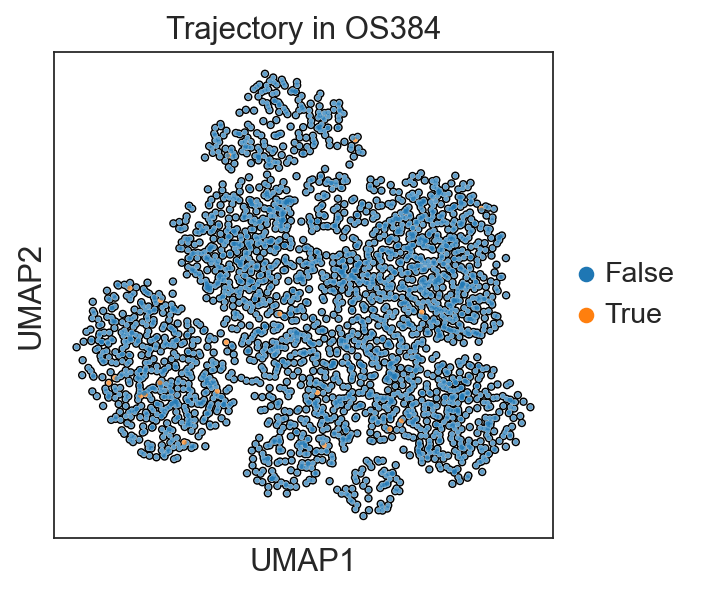

In [40]:
# reading in depleted 10X cell barcodes
trajectory_cell_barcodes = pd.read_csv("/Users/brendamelano/Desktop/trajectory_10X_384_inVivo_LT.csv")


# creating a vector with just the barcodes
trajectory_cell_barcodes = trajectory_cell_barcodes['x']


# removing the suffix from the seurat barcodes
trajectory_cell_barcodes = trajectory_cell_barcodes.map(lambda x: x.lstrip('').rstrip('-1'))

adata_obs = adata.obs_names

adata_obs = adata_obs.to_numpy()

# create new categorical column called `selection`
adata.obs['trajectory_10X'] = pd.Categorical(adata.obs_names.isin(trajectory_cell_barcodes)) 

sc.pl.umap(adata, color='trajectory_10X', add_outline=True, s=90, size = 20, title = 'Trajectory in OS384')

# reading in depleted 10X cell barcodes
trajectory_cell_barcodes = pd.read_csv("/Users/brendamelano/Desktop/trajectory_10X_384_inVivo_LT.csv")

# creating a vector with just the barcodes
trajectory_cell_barcodes = trajectory_cell_barcodes['x']

# removing the suffix from the seurat barcodes
trajectory_cell_barcodes = trajectory_cell_barcodes.map(lambda x: x.lstrip('').rstrip('-1'))

adata_obs = adata.obs_names

adata_obs = adata_obs.to_numpy()

# create new categorical column called `selection`
adata.obs['trajectory_10X'] = pd.Categorical(adata.obs_names.isin(trajectory_cell_barcodes)) 

sc.pl.umap(adata, color='trajectory_10X', add_outline=True, s=90, size = 20, title = 'Trajectory in OS384')

In [5]:
from matplotlib.colors import LinearSegmentedColormap

In [ ]:
colors = ["yellow", "purple"]  # You can also use RGB tuples
cmap_name = "yellow_purple"

yellow_purple_cmap = LinearSegmentedColormap.from_list(cmap_name, colors)

plt.register_cmap(cmap=yellow_purple_cmap)


In [5]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import kruskal

def plot_facet_gene_expression(adata, gene_list, output_file, cell_line, significance_threshold=0.05):
    """
    Quantify and visualize the expression of specified genes as a facet plot across different states.
    Applies FDR correction for multiple testing.

    Parameters:
    - adata: AnnData object 
    - gene_list: List of gene names to quantify and plot.
    - output_file: Path to save the resulting facet plot.
    - cell_line: String specifying the cell line name to include in plot titles.
    - significance_threshold: FDR threshold for significance (default is 0.05).
    """
    # Filter genes to keep only those present in the dataset
    genes_in_data = [gene for gene in gene_list if gene in adata.var_names]
    genes_not_found = [gene for gene in gene_list if gene not in adata.var_names]

    if genes_not_found:
        print(f"The following genes were not found in the dataset and will be skipped: {', '.join(genes_not_found)}")
    
    if not genes_in_data:
        print("None of the specified genes are present in the dataset.")
        return

    # List to store p-values for correction
    p_values = []

    # Create a DataFrame for plotting
    plot_df = pd.DataFrame()

    # Calculate mean expression and perform tests for each gene
    for gene in genes_in_data:
        # Extract the gene expression data
        gene_data = adata[:, gene].X.toarray().flatten()  # Get the gene expression vector

        # Create a DataFrame with state, gene name, and expression data
        gene_df = pd.DataFrame({
            'State': adata.obs['State'],
            'Expression': gene_data,
            'Gene': gene
        })

        # Append the gene-specific data to the main plot_df
        plot_df = pd.concat([plot_df, gene_df], axis=0)

        # Perform Kruskal-Wallis test (non-parametric alternative to ANOVA)
        _, p_value = kruskal(*[gene_df.loc[gene_df['State'] == state, 'Expression'] for state in gene_df['State'].unique()])
        p_values.append(p_value)

    # Step 2: Apply Benjamini-Hochberg (BH) correction
    _, corrected_pvals, _, _ = multipletests(p_values, alpha=significance_threshold, method='fdr_bh')

    # Step 3: Add corrected p-values to the DataFrame
    pval_dict = dict(zip(genes_in_data, corrected_pvals))
    plot_df['Corrected p-value'] = plot_df['Gene'].map(pval_dict)

    # Step 4: Create the facet plot
    g = sns.FacetGrid(plot_df, col='Gene', col_wrap=2, sharey=False, height=3, aspect=1.3)
    g.map(sns.barplot, 'State', 'Expression', palette='Set2', edgecolor='black')

    # Customize plot appearance
    for ax, gene in zip(g.axes.flat, genes_in_data):
        # Annotate each plot with the corrected p-value only
        pval = pval_dict[gene]
        ax.text(0.95, 0.95, f'p = {pval:.2e}',
                horizontalalignment='right', verticalalignment='center', transform=ax.transAxes, fontsize=12)  # Adjust p-value font size
        
        # Customize tick and label fonts
        ax.set_xlabel('')
        ax.set_ylabel(f'{gene} Expression', fontsize=12)  # Adjust Y-axis label font size
        ax.tick_params(axis='x', labelsize=12)  # Adjust X-axis number font size
        ax.tick_params(axis='y', labelsize=12)  # Adjust Y-axis number font size
        ax.set_title(f"{cell_line} - {gene}", fontsize=14)  # Adjust title font size

    # Set overall plot labels and layout
    g.set_titles(col_template="{col_name}", fontsize=14)  # Adjust the facet title font size
    g.set_xlabels("State", fontsize=14)  # Adjust X-axis label font size
    g.set_ylabels("Expression", fontsize=14)  # Adjust Y-axis label font size
    g.fig.suptitle(f"{cell_line} Gene Expression Across States", y=1.05, fontsize=20)  # Adjust the master title font size
    g.fig.tight_layout()

    # Save the facet plot
    plt.savefig(output_file, format='svg', dpi=300)
    plt.close()
    print(f"Facet plot saved to {output_file}")


# Path to save the output plot
output_file = '/Users/brendamelano/Desktop/OS052_drivers_expression_facet.svg'


# Specify the cell line name
cell_line = 'OS052'


# Gene list
gene_list = ['DDIT3', 'TSHZ2', 'STAT1', 'NR0B1', 'NFE2L3', 'TCF4', 'NFKB2', 'IRF1', 'ZIC2', 'KLF12', 'JUNB', 'JUN']


# Call the function to generate the facet plot
plot_facet_gene_expression(adata, gene_list, output_file, cell_line)

The following genes were not found in the dataset and will be skipped: STAT1, NR0B1, TCF4, NFKB2, IRF1, ZIC2


/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:712: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


Facet plot saved to /Users/brendamelano/Desktop/OS052_drivers_expression_facet.svg


computing score 'State_A_score'
    finished: added
    'State_A_score', score of gene set (adata.obs).
    50 total control genes are used. (0:00:00)
computing score 'Subtype_B_score'
    finished: added
    'Subtype_B_score', score of gene set (adata.obs).
    249 total control genes are used. (0:00:00)
computing score 'Subtype_C_score'
    finished: added
    'Subtype_C_score', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)


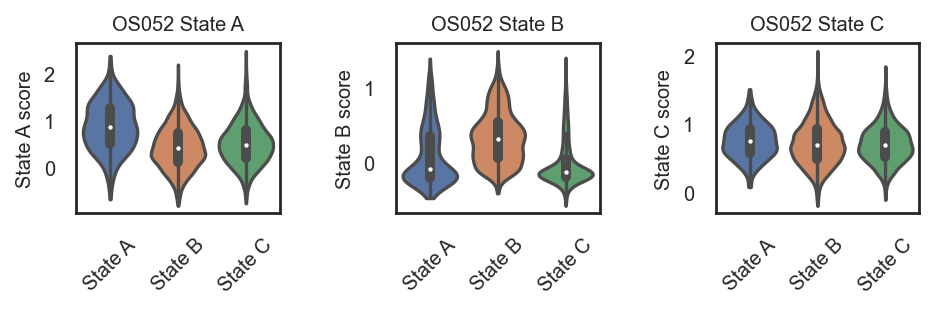

In [10]:
# Reading in gene lists for GSEA
Subtype_A_genes = [x.strip() for x in open('/Users/brendamelano/Desktop/gmt_files/Subtype_A_module.csv')]
Subtype_B_genes = [x.strip() for x in open('/Users/brendamelano/Desktop/gmt_files/Subtype_B_module.csv')]
Subtype_C_genes = [x.strip() for x in open('/Users/brendamelano/Desktop/gmt_files/Subtype_C_module.csv')]

# Keeping only genes that appear in the adata
Subtype_A_genes = [x for x in Subtype_A_genes if x in adata.var_names]
Subtype_B_genes = [x for x in Subtype_B_genes if x in adata.var_names]
Subtype_C_genes = [x for x in Subtype_C_genes if x in adata.var_names]

# Computing GSEA scores
sc.tl.score_genes(adata, Subtype_A_genes, ctrl_size=50, gene_pool=None, n_bins=25, 
                  score_name='State_A_score', random_state=0, copy=False, use_raw=None)
sc.tl.score_genes(adata, Subtype_B_genes, ctrl_size=50, gene_pool=None, n_bins=25, 
                  score_name='Subtype_B_score', random_state=0, copy=False, use_raw=None)
sc.tl.score_genes(adata, Subtype_C_genes, ctrl_size=50, gene_pool=None, n_bins=25, 
                  score_name='Subtype_C_score', random_state=0, copy=False, use_raw=None)

# Plotting the results with all fonts set to 9 and slanted x-axis titles
fig, axs = plt.subplots(1, 3, figsize=(6, 2.1))

sc.pl.violin(adata, ['State_A_score'], 
             groupby='State', stripplot=False, inner='box', 
             ylabel='', ax=axs[0], show=False)  # Set ylabel to empty string

axs[0].set_title('OS052 State A', fontsize=9)
axs[0].set_ylabel('State A score', fontsize=9)  # Set y-axis label with fontsize 9
axs[0].tick_params(axis='both', which='major', labelsize=9)
axs[0].tick_params(axis='x', rotation=45)
axs[0].set_xlabel('')  # Remove x-axis label

sc.pl.violin(adata, ['Subtype_B_score'], 
             groupby='State', stripplot=False, inner='box', 
             ylabel='', ax=axs[1], show=False)  # Set ylabel to empty string

axs[1].set_title('OS052 State B', fontsize=9)
axs[1].set_ylabel('State B score', fontsize=9)  # Set y-axis label with fontsize 9
axs[1].tick_params(axis='both', which='major', labelsize=9)
axs[1].tick_params(axis='x', rotation=45)
axs[1].set_xlabel('')  # Remove x-axis label

sc.pl.violin(adata, ['Subtype_C_score'], 
             groupby='State', stripplot=False, inner='box', 
             ylabel='', ax=axs[2], show=False)  # Set ylabel to empty string

axs[2].set_title('OS052 State C', fontsize=9)
axs[2].set_ylabel('State C score', fontsize=9)  # Set y-axis label with fontsize 9
axs[2].tick_params(axis='both', which='major', labelsize=9)
axs[2].tick_params(axis='x', rotation=45)
axs[2].set_xlabel('')  # Remove x-axis label

plt.tight_layout()

# Saving the figure onto the desktop
plt.savefig('/Users/brendamelano/Desktop/OS052_gsea_scores.svg', format='svg')
plt.show()


# Computing Quiescence score

In [31]:
# setting the directory for the quiescence score
directory = '/Users/brendamelano/Desktop/gmt_files/quiescence/quiescence.txt'

quiescence_markers = pd.read_csv(directory, sep='\t', header = None)

quiescence_markers

quiescence_markers = quiescence_markers[0]

with open('/Users/brendamelano/Desktop/gmt_files/quiescence.txt', 'r') as file:
    
    senescence_list = [line.strip() for line in file]
    

sc.tl.score_genes(
    adata, 
    gene_list=quiescence_markers, 
    ctrl_size=50, 
    gene_pool=None,
    n_bins=5, 
    score_name = "quiescence_score", 
    random_state=0, 
    copy=False, 
    use_raw=None
)

sc.pl.umap(
    adata,
    color=["quiescence_score"],
    frameon=True,
    title = "OS384 Quiescence signature enrichment"
)

sc.pl.violin(adata, ['quiescence_score'], groupby='leiden_scVI', stripplot=False, inner='box')

sc.pl.umap(
    adata,
    color=["leiden_scVI"],
    frameon=True,
    title = "OS384 Quiescence signature enrichment"
)

# scoring cell cycle

97
76
calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    536 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    613 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


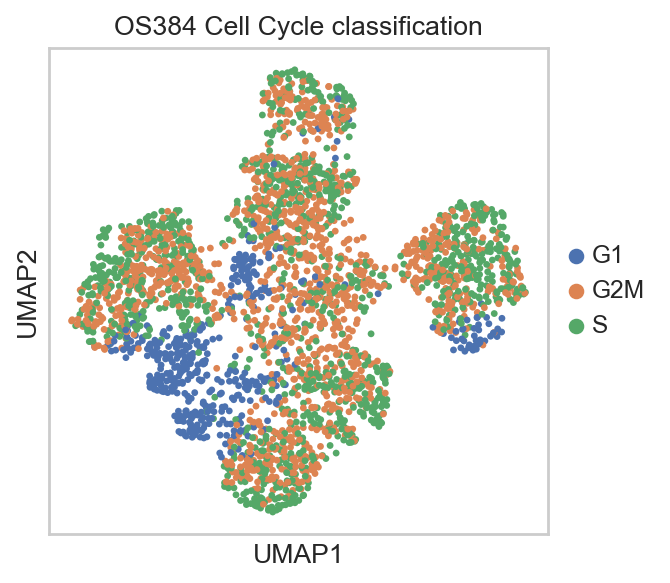

In [20]:
cell_cycle_genes = [x.strip() for x in open('/Users/brendamelano/Desktop/scvi/regev_lab_cell_cycle_genes.txt')]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
print(len(cell_cycle_genes))

sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

sc.pl.umap(
    adata,
    color=["phase"],
    frameon=True,
    title = "OS384 Cell Cycle classification"
)

# pathway enrichment analysis

In [11]:
# Defining the directory for the gmt files
directory = '/Users/brendamelano/Desktop/gmt_files'

# Create a dictionary to store gene lists
gene_lists = {}

# Create variables for gene lists
for filename in os.listdir(directory):
    if filename.endswith('.txt'):
        variable_name = os.path.splitext(filename)[0].upper()
        variable_name += "_genes"
        with open(os.path.join(directory, filename)) as f:
            gene_lists[variable_name] = [line.strip() for line in f]

# Create a dictionary to store gene scores for each module
gene_scores = {}

# Quantify enrichment for each gene list
for gene_list_name, gene_list in gene_lists.items():
    scores_key = gene_list_name + "_score"
    try:
        gene_scores[gene_list_name] = sc.tl.score_genes(
            adata, gene_list, ctrl_size=50, gene_pool=None,
            n_bins=5, score_name=scores_key, random_state=0, 
            copy=False, use_raw=None
        )
    except KeyError:
        continue

        
scores = ['CSR_genes_score', 'GCNP_genes_score','LEF1_genes_score',
          'FOCAL_ADHESION_PI3KAKTMTOR_genes_score', 'TGFB_genes_score',   'STK33_genes_score',
          'PDGF_ERK1_DOWN_genes_score','IL2_genes_score',
         'ESC_genes_score',  'TNFA_genes_score', 'KRAS_genes_score']


sc.pl.matrixplot(
    adata,
    scores,
    "leiden",
    dendrogram=False,
    cmap="Blues",
    standard_scale="var",
    colorbar_title="column scaled\nexpression",
)


computing score 'IL2_genes_score'
    finished: added
    'IL2_genes_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score 'MTOR_genes_score'
    finished: added
    'MTOR_genes_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
computing score 'FOCAL_ADHESION_PI3KAKTMTOR_genes_score'
    finished: added
    'FOCAL_ADHESION_PI3KAKTMTOR_genes_score', score of gene set (adata.obs).
    196 total control genes are used. (0:00:00)
computing score 'PDGF_ERK1_DOWN_genes_score'
    finished: added
    'PDGF_ERK1_DOWN_genes_score', score of gene set (adata.obs).
    149 total control genes are used. (0:00:00)
computing score 'TNFA_genes_score'


    finished: added
    'TNFA_genes_score', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'GCNP_genes_score'
    finished: added
    'GCNP_genes_score', score of gene set (adata.obs).
    198 total control genes are used. (0:00:00)
computing score 'CSR_genes_score'
    finished: added
    'CSR_genes_score', score of gene set (adata.obs).
    198 total control genes are used. (0:00:00)
computing score 'ESC_genes_score'
    finished: added
    'ESC_genes_score', score of gene set (adata.obs).
    199 total control genes are used. (0:00:00)
computing score 'PI3KAKTMTOR_genes_score'


ValueError: No valid genes were passed for scoring.

In [ ]:
# Extract only the variable names before the first underscore
gene_variables = [score.split('_')[0] for score in scores]

# Create a new figure and axis for the heatmap
fig, ax = plt.subplots(figsize=(8, 12))

# Plot the heatmap using seaborn
sns.heatmap(
    adata.obs,
    xticklabels=gene_variables,
    yticklabels=False,  # Optionally, you can set yticklabels to False if you don't want them
    cmap='viridis',
    annot=False,  # Optionally, set annot=True to display numerical values
    cbar=True,
    linewidths=0.5,  # Optionally, set linewidths to adjust cell spacing
    ax=ax,
)

# Set the title of the heatmap (you can customize this)
plt.title("Heatmap of Gene Scores")

# Save the heatmap with a DPI of 300 as an SVG file
plt.savefig("OS384_pathway_heatmap.svg", dpi=300, bbox_inches='tight')

# Show the heatmap (optional, you can remove this line if you don't want to display it)
plt.show()

# DGE between all clusters

In [68]:
# comparing each cell type to the rest
de_df = model.differential_expression(
    groupby="leiden_scVI",
)

de_df.head()

# identifying the top marklers within each cluster

# creating an empty array with which to store the markers
markers = {}


cats = adata.obs.leiden_scVI.cat.categories


for i, c in enumerate(cats):
    cid = "{} vs Rest".format(c)
    cell_type_df = de_df.loc[de_df.comparison == cid]

    cell_type_df = cell_type_df[cell_type_df.lfc_median > 1]

    cell_type_df = cell_type_df[cell_type_df["bayes_factor"] > 2]
    cell_type_df = cell_type_df[cell_type_df["non_zeros_proportion1"] > 0.1]

    markers[c] = cell_type_df.index.tolist()[:30]
    

sc.pl.heatmap(
    adata,
    markers,
    groupby="leiden_scVI",
    layer="scvi_normalized",
    standard_scale="var",
    dendrogram=True,
    figsize=(8, 12),
)

DE...: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:05<00:00,  1.21it/s]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
Gene,,,,,,,,,,,,,,,,,,,,,
GPX7,0.9832,0.0168,4.069433,0.000050,0.000326,0.0,0.25,-3.123426,-3.158513,1.471178,...,0.047049,0.398945,0.064516,0.452610,0.395677,3.350554,True,0 vs Rest,0,Rest
TSHZ2,0.9770,0.0230,3.748992,0.000176,0.000016,0.0,0.25,4.937335,4.990950,3.239599,...,0.210060,0.013512,0.264268,0.022129,1.781544,0.115850,True,0 vs Rest,0,Rest
ME3,0.9770,0.0230,3.748992,0.000021,0.000124,0.0,0.25,-2.887966,-2.941550,1.581863,...,0.023461,0.150241,0.034739,0.198747,0.206757,1.260390,True,0 vs Rest,0,Rest
PRTFDC1,0.9770,0.0230,3.748992,0.000087,0.000420,0.0,0.25,-2.415319,-2.443881,1.195045,...,0.095898,0.509492,0.129032,0.537370,0.811996,4.264960,True,0 vs Rest,0,Rest
ZMYND11,0.9752,0.0248,3.671799,0.000020,0.000352,0.0,0.25,-3.955621,-4.371737,3.329457,...,0.016235,0.432364,0.024814,0.444676,0.137525,3.605512,True,0 vs Rest,0,Rest


# DGEA between 2 cell types

In [ ]:
# performing dgea between two cell types
# This command may be outdated
de_df = model.differential_expression(
    group1="3",
    group2="1",
    groupby="leiden_scVI"
)

de_df.head(20)

# heatmap
sc.pl.heatmap(
    adata, 
    markers, 
    groupby='cell_type', 
    layer="scvi_normalized",
    standard_scale="var",
    dendrogram=True,
    figsize=(8, 12)
)

de_df[de_df.group1 == '3']

In [48]:
markers = {'Source': ['MGLL',
  'TUBA4A',
  'GALNT14',
  'F2R',
  'HLA-B',
  'MATK',
  'PSRC1',
  'H4C3',
  'KIFC1',
  'AK4',
  'CYBA',
  'SERINC2',
  'EPHB2',
  'CIBAR1'],
 'Subtype A': ['MGLL', 'H2BC5', 'H2AC6', 'H2BC4'],
 'Subtype B': ['CA3', 'TAC3', 'CFAP251', 'LINC01549', 'SLC2A1'],
 'Subtype C': ['HEY1',
  'ZNF704',
  'BASP1',
  'TMEM70',
  'S100A4',
  'ELOC',
  'LUM',
  'DCN',
  'PEX2',
  'RPL7',
  'MXRA8',
  'BHMT2',
  'MARK1',
  'MYLPF',
  'ZFHX4',
  'TERF1',
  'SGCA',
  'SHOX2',
  'EPHX1',
  'PRRX1',
  'DSP',
  'IBSP',
  'PLAAT3',
  'ZBTB10',
  'KRT18',
  'IL4R',
  'GNG4',
  'COL3A1']}

In [49]:
sc.pl.dotplot(adata, markers, 'Subtype', title = 'Subtype Markers')

ValueError: groupby has to be a valid observation. Given Subtype, is not in observations: ['n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'tenX_barcode', 'depleted_10X', 'angiogenic_score'] or index name "CellID"

# scVI for dim reduction

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/data/fields/_layer_field.py:91: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 1/400:   0%|                                                                                                                                               | 0/400 [00:00<?, ?it/s]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 2/400:   0%|▎                                                                                                              | 1/400 [00:00<03:48,  1.74it/s, loss=1.92e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 3/400:   0%|▌                                                                                                              | 2/400 [00:01<03:37,  1.83it/s, loss=1.68e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 4/400:   1%|▊                                                                                                              | 3/400 [00:01<03:30,  1.89it/s, loss=1.59e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 5/400:   1%|█                                                                                                              | 4/400 [00:02<03:34,  1.85it/s, loss=1.55e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 6/400:   1%|█▍                                                                                                             | 5/400 [00:02<03:36,  1.82it/s, loss=1.52e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 7/400:   2%|█▋                                                                                                             | 6/400 [00:03<03:34,  1.84it/s, loss=1.51e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 8/400:   2%|█▉                                                                                                              | 7/400 [00:03<03:25,  1.91it/s, loss=1.5e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 9/400:   2%|██▏                                                                                                            | 8/400 [00:04<03:29,  1.87it/s, loss=1.49e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 10/400:   2%|██▍                                                                                                           | 9/400 [00:04<03:24,  1.91it/s, loss=1.48e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 11/400:   2%|██▋                                                                                                          | 10/400 [00:05<03:21,  1.94it/s, loss=1.47e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 12/400:   3%|██▉                                                                                                          | 11/400 [00:05<03:26,  1.88it/s, loss=1.46e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 13/400:   3%|███▎                                                                                                         | 12/400 [00:06<03:21,  1.92it/s, loss=1.46e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 14/400:   3%|███▌                                                                                                         | 13/400 [00:06<03:22,  1.91it/s, loss=1.45e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 14/400:   4%|███▊                                                                                                         | 14/400 [00:07<03:17,  1.95it/s, loss=1.45e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 15/400:   4%|███▊                                                                                                         | 14/400 [00:07<03:17,  1.95it/s, loss=1.45e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 16/400:   4%|████                                                                                                         | 15/400 [00:07<03:13,  1.99it/s, loss=1.44e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 17/400:   4%|████▎                                                                                                        | 16/400 [00:08<03:10,  2.01it/s, loss=1.44e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 18/400:   4%|████▋                                                                                                        | 17/400 [00:08<03:09,  2.02it/s, loss=1.43e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 19/400:   4%|████▉                                                                                                        | 18/400 [00:09<03:09,  2.01it/s, loss=1.43e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 20/400:   5%|█████▏                                                                                                       | 19/400 [00:09<03:08,  2.02it/s, loss=1.42e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 21/400:   5%|█████▍                                                                                                       | 20/400 [00:10<03:09,  2.01it/s, loss=1.42e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 22/400:   5%|█████▋                                                                                                       | 21/400 [00:10<03:13,  1.96it/s, loss=1.41e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 23/400:   6%|█████▉                                                                                                       | 22/400 [00:11<03:10,  1.98it/s, loss=1.41e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 24/400:   6%|██████▎                                                                                                      | 23/400 [00:11<03:08,  2.00it/s, loss=1.41e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 25/400:   6%|██████▌                                                                                                       | 24/400 [00:12<03:08,  2.00it/s, loss=1.4e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 25/400:   6%|██████▉                                                                                                       | 25/400 [00:12<03:06,  2.01it/s, loss=1.4e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 26/400:   6%|██████▉                                                                                                       | 25/400 [00:12<03:06,  2.01it/s, loss=1.4e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 27/400:   6%|███████                                                                                                      | 26/400 [00:13<03:04,  2.02it/s, loss=1.39e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 28/400:   7%|███████▎                                                                                                     | 27/400 [00:13<03:03,  2.03it/s, loss=1.39e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 29/400:   7%|███████▋                                                                                                     | 28/400 [00:14<03:04,  2.02it/s, loss=1.39e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 30/400:   7%|███████▉                                                                                                     | 29/400 [00:14<03:03,  2.02it/s, loss=1.38e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 31/400:   8%|████████▏                                                                                                    | 30/400 [00:15<03:02,  2.02it/s, loss=1.38e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 32/400:   8%|████████▍                                                                                                    | 31/400 [00:15<03:02,  2.02it/s, loss=1.38e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 33/400:   8%|████████▋                                                                                                    | 32/400 [00:16<03:01,  2.02it/s, loss=1.37e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 34/400:   8%|████████▉                                                                                                    | 33/400 [00:16<03:00,  2.04it/s, loss=1.37e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 35/400:   8%|█████████▎                                                                                                   | 34/400 [00:17<02:58,  2.05it/s, loss=1.37e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 36/400:   9%|█████████▌                                                                                                   | 35/400 [00:17<02:58,  2.04it/s, loss=1.36e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 37/400:   9%|█████████▊                                                                                                   | 36/400 [00:18<02:57,  2.05it/s, loss=1.36e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 38/400:   9%|██████████                                                                                                   | 37/400 [00:18<02:56,  2.05it/s, loss=1.36e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 38/400:  10%|██████████▎                                                                                                  | 38/400 [00:19<02:58,  2.03it/s, loss=1.36e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 39/400:  10%|██████████▎                                                                                                  | 38/400 [00:19<02:58,  2.03it/s, loss=1.36e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 40/400:  10%|██████████▋                                                                                                  | 39/400 [00:19<02:57,  2.03it/s, loss=1.35e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 40/400:  10%|██████████▉                                                                                                  | 40/400 [00:20<02:58,  2.02it/s, loss=1.35e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 41/400:  10%|██████████▉                                                                                                  | 40/400 [00:20<02:58,  2.02it/s, loss=1.35e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 42/400:  10%|███████████▏                                                                                                 | 41/400 [00:20<02:55,  2.05it/s, loss=1.35e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 43/400:  10%|███████████▍                                                                                                 | 42/400 [00:21<03:02,  1.96it/s, loss=1.35e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 44/400:  11%|███████████▋                                                                                                 | 43/400 [00:21<03:02,  1.95it/s, loss=1.34e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 45/400:  11%|███████████▉                                                                                                 | 44/400 [00:22<02:58,  2.00it/s, loss=1.34e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 46/400:  11%|████████████▎                                                                                                | 45/400 [00:22<03:02,  1.94it/s, loss=1.34e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 47/400:  12%|████████████▌                                                                                                | 46/400 [00:23<02:58,  1.99it/s, loss=1.34e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 48/400:  12%|████████████▊                                                                                                | 47/400 [00:23<02:55,  2.01it/s, loss=1.33e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 49/400:  12%|█████████████                                                                                                | 48/400 [00:24<02:52,  2.04it/s, loss=1.33e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 50/400:  12%|█████████████▎                                                                                               | 49/400 [00:24<02:50,  2.06it/s, loss=1.33e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 51/400:  12%|█████████████▋                                                                                               | 50/400 [00:25<02:48,  2.07it/s, loss=1.33e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 52/400:  13%|█████████████▉                                                                                               | 51/400 [00:25<02:47,  2.09it/s, loss=1.32e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 53/400:  13%|██████████████▏                                                                                              | 52/400 [00:26<02:46,  2.09it/s, loss=1.32e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 54/400:  13%|██████████████▍                                                                                              | 53/400 [00:26<02:45,  2.09it/s, loss=1.32e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 55/400:  14%|██████████████▋                                                                                              | 54/400 [00:27<02:45,  2.09it/s, loss=1.32e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 56/400:  14%|██████████████▉                                                                                              | 55/400 [00:27<02:44,  2.10it/s, loss=1.31e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 57/400:  14%|███████████████▎                                                                                             | 56/400 [00:28<02:45,  2.07it/s, loss=1.31e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 58/400:  14%|███████████████▌                                                                                             | 57/400 [00:28<02:44,  2.09it/s, loss=1.31e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 59/400:  14%|███████████████▊                                                                                             | 58/400 [00:28<02:42,  2.11it/s, loss=1.31e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 60/400:  15%|████████████████                                                                                             | 59/400 [00:29<02:41,  2.11it/s, loss=1.31e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 61/400:  15%|████████████████▌                                                                                             | 60/400 [00:29<02:41,  2.10it/s, loss=1.3e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 62/400:  15%|████████████████▊                                                                                             | 61/400 [00:30<02:40,  2.11it/s, loss=1.3e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 63/400:  16%|█████████████████                                                                                             | 62/400 [00:30<02:39,  2.12it/s, loss=1.3e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 64/400:  16%|█████████████████▎                                                                                            | 63/400 [00:31<02:38,  2.13it/s, loss=1.3e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 65/400:  16%|█████████████████▌                                                                                            | 64/400 [00:31<02:37,  2.13it/s, loss=1.3e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 66/400:  16%|█████████████████▋                                                                                           | 65/400 [00:32<02:36,  2.14it/s, loss=1.29e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 67/400:  16%|█████████████████▉                                                                                           | 66/400 [00:32<02:36,  2.13it/s, loss=1.29e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 68/400:  17%|██████████████████▎                                                                                          | 67/400 [00:33<02:35,  2.14it/s, loss=1.29e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 69/400:  17%|██████████████████▌                                                                                          | 68/400 [00:33<02:34,  2.15it/s, loss=1.29e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 70/400:  17%|██████████████████▊                                                                                          | 69/400 [00:34<02:34,  2.14it/s, loss=1.29e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 71/400:  18%|███████████████████                                                                                          | 70/400 [00:34<02:34,  2.13it/s, loss=1.28e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 72/400:  18%|███████████████████▎                                                                                         | 71/400 [00:35<02:34,  2.13it/s, loss=1.28e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 73/400:  18%|███████████████████▌                                                                                         | 72/400 [00:35<02:33,  2.13it/s, loss=1.28e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 74/400:  18%|███████████████████▉                                                                                         | 73/400 [00:36<02:33,  2.13it/s, loss=1.28e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 75/400:  18%|████████████████████▏                                                                                        | 74/400 [00:36<02:32,  2.14it/s, loss=1.28e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 76/400:  19%|████████████████████▍                                                                                        | 75/400 [00:36<02:32,  2.13it/s, loss=1.28e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 77/400:  19%|████████████████████▋                                                                                        | 76/400 [00:37<02:31,  2.14it/s, loss=1.27e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 78/400:  19%|████████████████████▉                                                                                        | 77/400 [00:37<02:31,  2.14it/s, loss=1.27e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 79/400:  20%|█████████████████████▎                                                                                       | 78/400 [00:38<02:30,  2.14it/s, loss=1.27e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 80/400:  20%|█████████████████████▌                                                                                       | 79/400 [00:38<02:29,  2.15it/s, loss=1.27e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 81/400:  20%|█████████████████████▊                                                                                       | 80/400 [00:39<02:29,  2.14it/s, loss=1.27e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 82/400:  20%|██████████████████████                                                                                       | 81/400 [00:39<02:28,  2.15it/s, loss=1.27e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 83/400:  20%|██████████████████████▎                                                                                      | 82/400 [00:40<02:28,  2.14it/s, loss=1.27e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 84/400:  21%|██████████████████████▌                                                                                      | 83/400 [00:40<02:28,  2.14it/s, loss=1.26e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 85/400:  21%|██████████████████████▉                                                                                      | 84/400 [00:41<02:27,  2.14it/s, loss=1.26e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 86/400:  21%|███████████████████████▏                                                                                     | 85/400 [00:41<02:29,  2.11it/s, loss=1.26e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 87/400:  22%|███████████████████████▍                                                                                     | 86/400 [00:42<02:28,  2.11it/s, loss=1.26e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 88/400:  22%|███████████████████████▋                                                                                     | 87/400 [00:42<02:27,  2.12it/s, loss=1.26e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 89/400:  22%|███████████████████████▉                                                                                     | 88/400 [00:43<02:26,  2.13it/s, loss=1.26e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 90/400:  22%|████████████████████████▎                                                                                    | 89/400 [00:43<02:25,  2.13it/s, loss=1.26e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 91/400:  22%|████████████████████████▌                                                                                    | 90/400 [00:43<02:24,  2.14it/s, loss=1.25e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 92/400:  23%|████████████████████████▊                                                                                    | 91/400 [00:44<02:24,  2.14it/s, loss=1.25e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 93/400:  23%|█████████████████████████                                                                                    | 92/400 [00:44<02:23,  2.15it/s, loss=1.25e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 94/400:  23%|█████████████████████████▎                                                                                   | 93/400 [00:45<02:22,  2.15it/s, loss=1.25e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 95/400:  24%|█████████████████████████▌                                                                                   | 94/400 [00:45<02:22,  2.15it/s, loss=1.25e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 96/400:  24%|█████████████████████████▉                                                                                   | 95/400 [00:46<02:22,  2.14it/s, loss=1.25e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 97/400:  24%|██████████████████████████▏                                                                                  | 96/400 [00:46<02:21,  2.16it/s, loss=1.25e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 98/400:  24%|██████████████████████████▍                                                                                  | 97/400 [00:47<02:20,  2.15it/s, loss=1.25e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 99/400:  24%|██████████████████████████▋                                                                                  | 98/400 [00:47<02:20,  2.15it/s, loss=1.24e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 100/400:  25%|██████████████████████████▋                                                                                 | 99/400 [00:48<02:19,  2.15it/s, loss=1.24e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 101/400:  25%|██████████████████████████▊                                                                                | 100/400 [00:48<02:19,  2.15it/s, loss=1.24e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 102/400:  25%|███████████████████████████                                                                                | 101/400 [00:49<02:19,  2.15it/s, loss=1.24e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 103/400:  26%|███████████████████████████▎                                                                               | 102/400 [00:49<02:18,  2.15it/s, loss=1.24e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 104/400:  26%|███████████████████████████▌                                                                               | 103/400 [00:50<02:17,  2.15it/s, loss=1.24e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 105/400:  26%|███████████████████████████▊                                                                               | 104/400 [00:50<02:17,  2.16it/s, loss=1.24e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 106/400:  26%|████████████████████████████                                                                               | 105/400 [00:50<02:16,  2.16it/s, loss=1.24e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 107/400:  26%|████████████████████████████▎                                                                              | 106/400 [00:51<02:18,  2.13it/s, loss=1.24e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 108/400:  27%|████████████████████████████▌                                                                              | 107/400 [00:51<02:17,  2.14it/s, loss=1.24e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 109/400:  27%|████████████████████████████▉                                                                              | 108/400 [00:52<02:16,  2.14it/s, loss=1.23e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 110/400:  27%|█████████████████████████████▏                                                                             | 109/400 [00:52<02:16,  2.14it/s, loss=1.23e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 111/400:  28%|█████████████████████████████▍                                                                             | 110/400 [00:53<02:15,  2.14it/s, loss=1.23e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 112/400:  28%|█████████████████████████████▋                                                                             | 111/400 [00:53<02:14,  2.15it/s, loss=1.23e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 113/400:  28%|█████████████████████████████▉                                                                             | 112/400 [00:54<02:14,  2.15it/s, loss=1.23e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 114/400:  28%|██████████████████████████████▏                                                                            | 113/400 [00:54<02:13,  2.15it/s, loss=1.23e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 115/400:  28%|██████████████████████████████▍                                                                            | 114/400 [00:55<02:12,  2.15it/s, loss=1.23e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 116/400:  29%|██████████████████████████████▊                                                                            | 115/400 [00:55<02:12,  2.15it/s, loss=1.23e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 117/400:  29%|███████████████████████████████                                                                            | 116/400 [00:56<02:11,  2.15it/s, loss=1.23e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 118/400:  29%|███████████████████████████████▎                                                                           | 117/400 [00:56<02:11,  2.15it/s, loss=1.23e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 119/400:  30%|███████████████████████████████▌                                                                           | 118/400 [00:57<02:11,  2.14it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 120/400:  30%|███████████████████████████████▊                                                                           | 119/400 [00:57<02:11,  2.14it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 121/400:  30%|████████████████████████████████                                                                           | 120/400 [00:57<02:10,  2.15it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 122/400:  30%|████████████████████████████████▎                                                                          | 121/400 [00:58<02:09,  2.15it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 123/400:  30%|████████████████████████████████▋                                                                          | 122/400 [00:58<02:09,  2.15it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 124/400:  31%|████████████████████████████████▉                                                                          | 123/400 [00:59<02:08,  2.16it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 125/400:  31%|█████████████████████████████████▏                                                                         | 124/400 [00:59<02:07,  2.16it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 126/400:  31%|█████████████████████████████████▍                                                                         | 125/400 [01:00<02:07,  2.15it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 127/400:  32%|█████████████████████████████████▋                                                                         | 126/400 [01:00<02:07,  2.15it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 128/400:  32%|█████████████████████████████████▉                                                                         | 127/400 [01:01<02:07,  2.15it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 129/400:  32%|██████████████████████████████████▏                                                                        | 128/400 [01:01<02:06,  2.15it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 130/400:  32%|██████████████████████████████████▌                                                                        | 129/400 [01:02<02:05,  2.15it/s, loss=1.22e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 131/400:  32%|██████████████████████████████████▊                                                                        | 130/400 [01:02<02:05,  2.15it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 132/400:  33%|███████████████████████████████████                                                                        | 131/400 [01:03<02:05,  2.15it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 133/400:  33%|███████████████████████████████████▎                                                                       | 132/400 [01:03<02:04,  2.15it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 134/400:  33%|███████████████████████████████████▌                                                                       | 133/400 [01:03<02:04,  2.15it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 135/400:  34%|███████████████████████████████████▊                                                                       | 134/400 [01:04<02:03,  2.15it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 136/400:  34%|████████████████████████████████████                                                                       | 135/400 [01:04<02:03,  2.15it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 137/400:  34%|████████████████████████████████████▍                                                                      | 136/400 [01:05<02:02,  2.16it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 138/400:  34%|████████████████████████████████████▋                                                                      | 137/400 [01:05<02:02,  2.15it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 139/400:  34%|████████████████████████████████████▉                                                                      | 138/400 [01:06<02:01,  2.16it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 140/400:  35%|█████████████████████████████████████▏                                                                     | 139/400 [01:06<02:00,  2.16it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 141/400:  35%|█████████████████████████████████████▍                                                                     | 140/400 [01:07<02:00,  2.17it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 142/400:  35%|█████████████████████████████████████▋                                                                     | 141/400 [01:07<01:59,  2.16it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 143/400:  36%|█████████████████████████████████████▉                                                                     | 142/400 [01:08<01:59,  2.16it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 144/400:  36%|██████████████████████████████████████▎                                                                    | 143/400 [01:08<01:58,  2.16it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 145/400:  36%|██████████████████████████████████████▌                                                                    | 144/400 [01:09<01:58,  2.16it/s, loss=1.21e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 146/400:  36%|███████████████████████████████████████▏                                                                    | 145/400 [01:09<01:58,  2.15it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 147/400:  36%|███████████████████████████████████████▍                                                                    | 146/400 [01:10<01:58,  2.15it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 148/400:  37%|███████████████████████████████████████▋                                                                    | 147/400 [01:10<02:00,  2.09it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 149/400:  37%|███████████████████████████████████████▉                                                                    | 148/400 [01:11<02:00,  2.10it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 150/400:  37%|████████████████████████████████████████▏                                                                   | 149/400 [01:11<01:59,  2.10it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 151/400:  38%|████████████████████████████████████████▌                                                                   | 150/400 [01:11<01:57,  2.12it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 152/400:  38%|████████████████████████████████████████▊                                                                   | 151/400 [01:12<01:56,  2.13it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 153/400:  38%|█████████████████████████████████████████                                                                   | 152/400 [01:12<01:55,  2.14it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 154/400:  38%|█████████████████████████████████████████▎                                                                  | 153/400 [01:13<01:55,  2.15it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 155/400:  38%|█████████████████████████████████████████▌                                                                  | 154/400 [01:13<01:56,  2.12it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 156/400:  39%|█████████████████████████████████████████▊                                                                  | 155/400 [01:14<01:59,  2.05it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 157/400:  39%|██████████████████████████████████████████                                                                  | 156/400 [01:14<02:00,  2.02it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 158/400:  39%|██████████████████████████████████████████▍                                                                 | 157/400 [01:15<01:58,  2.05it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 159/400:  40%|██████████████████████████████████████████▋                                                                 | 158/400 [01:15<01:56,  2.08it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 160/400:  40%|██████████████████████████████████████████▉                                                                 | 159/400 [01:16<01:54,  2.10it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 161/400:  40%|███████████████████████████████████████████▏                                                                | 160/400 [01:16<01:53,  2.12it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 162/400:  40%|███████████████████████████████████████████▍                                                                | 161/400 [01:17<01:52,  2.13it/s, loss=1.2e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 163/400:  40%|███████████████████████████████████████████▎                                                               | 162/400 [01:17<01:51,  2.14it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 164/400:  41%|███████████████████████████████████████████▌                                                               | 163/400 [01:18<01:50,  2.14it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 165/400:  41%|███████████████████████████████████████████▊                                                               | 164/400 [01:18<01:49,  2.15it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 166/400:  41%|████████████████████████████████████████████▏                                                              | 165/400 [01:19<01:49,  2.15it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 167/400:  42%|████████████████████████████████████████████▍                                                              | 166/400 [01:19<01:50,  2.12it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 168/400:  42%|████████████████████████████████████████████▋                                                              | 167/400 [01:19<01:49,  2.13it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 169/400:  42%|████████████████████████████████████████████▉                                                              | 168/400 [01:20<01:48,  2.14it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 170/400:  42%|█████████████████████████████████████████████▏                                                             | 169/400 [01:20<01:47,  2.15it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 171/400:  42%|█████████████████████████████████████████████▍                                                             | 170/400 [01:21<01:47,  2.15it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 172/400:  43%|█████████████████████████████████████████████▋                                                             | 171/400 [01:21<01:46,  2.15it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 173/400:  43%|██████████████████████████████████████████████                                                             | 172/400 [01:22<01:46,  2.14it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 174/400:  43%|██████████████████████████████████████████████▎                                                            | 173/400 [01:22<01:45,  2.15it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 175/400:  44%|██████████████████████████████████████████████▌                                                            | 174/400 [01:23<01:44,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 176/400:  44%|██████████████████████████████████████████████▊                                                            | 175/400 [01:23<01:44,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 177/400:  44%|███████████████████████████████████████████████                                                            | 176/400 [01:24<01:43,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 178/400:  44%|███████████████████████████████████████████████▎                                                           | 177/400 [01:24<01:43,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 179/400:  44%|███████████████████████████████████████████████▌                                                           | 178/400 [01:25<01:42,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 180/400:  45%|███████████████████████████████████████████████▉                                                           | 179/400 [01:25<01:42,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 181/400:  45%|████████████████████████████████████████████████▏                                                          | 180/400 [01:26<01:41,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 182/400:  45%|████████████████████████████████████████████████▍                                                          | 181/400 [01:26<01:41,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 183/400:  46%|████████████████████████████████████████████████▋                                                          | 182/400 [01:26<01:40,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 184/400:  46%|████████████████████████████████████████████████▉                                                          | 183/400 [01:27<01:40,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 185/400:  46%|█████████████████████████████████████████████████▏                                                         | 184/400 [01:27<01:40,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 186/400:  46%|█████████████████████████████████████████████████▍                                                         | 185/400 [01:28<01:40,  2.14it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 187/400:  46%|█████████████████████████████████████████████████▊                                                         | 186/400 [01:28<01:40,  2.13it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 188/400:  47%|██████████████████████████████████████████████████                                                         | 187/400 [01:29<01:39,  2.14it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 189/400:  47%|██████████████████████████████████████████████████▎                                                        | 188/400 [01:29<01:38,  2.15it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 190/400:  47%|██████████████████████████████████████████████████▌                                                        | 189/400 [01:30<01:38,  2.15it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 191/400:  48%|██████████████████████████████████████████████████▊                                                        | 190/400 [01:30<01:37,  2.16it/s, loss=1.19e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 192/400:  48%|███████████████████████████████████████████████████                                                        | 191/400 [01:31<01:37,  2.15it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 193/400:  48%|███████████████████████████████████████████████████▎                                                       | 192/400 [01:31<01:36,  2.15it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 194/400:  48%|███████████████████████████████████████████████████▋                                                       | 193/400 [01:32<01:35,  2.16it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 195/400:  48%|███████████████████████████████████████████████████▉                                                       | 194/400 [01:32<01:35,  2.16it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 196/400:  49%|████████████████████████████████████████████████████▏                                                      | 195/400 [01:32<01:34,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 197/400:  49%|████████████████████████████████████████████████████▍                                                      | 196/400 [01:33<01:34,  2.16it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 198/400:  49%|████████████████████████████████████████████████████▋                                                      | 197/400 [01:33<01:34,  2.16it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 199/400:  50%|████████████████████████████████████████████████████▉                                                      | 198/400 [01:34<01:33,  2.16it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 200/400:  50%|█████████████████████████████████████████████████████▏                                                     | 199/400 [01:34<01:32,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 201/400:  50%|█████████████████████████████████████████████████████▌                                                     | 200/400 [01:35<01:32,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 202/400:  50%|█████████████████████████████████████████████████████▊                                                     | 201/400 [01:35<01:31,  2.18it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 203/400:  50%|██████████████████████████████████████████████████████                                                     | 202/400 [01:36<01:30,  2.18it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 204/400:  51%|██████████████████████████████████████████████████████▎                                                    | 203/400 [01:36<01:30,  2.18it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 205/400:  51%|██████████████████████████████████████████████████████▌                                                    | 204/400 [01:37<01:30,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 206/400:  51%|██████████████████████████████████████████████████████▊                                                    | 205/400 [01:37<01:29,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 207/400:  52%|███████████████████████████████████████████████████████                                                    | 206/400 [01:38<01:29,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 208/400:  52%|███████████████████████████████████████████████████████▎                                                   | 207/400 [01:38<01:29,  2.16it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 209/400:  52%|███████████████████████████████████████████████████████▋                                                   | 208/400 [01:38<01:28,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 210/400:  52%|███████████████████████████████████████████████████████▉                                                   | 209/400 [01:39<01:28,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 211/400:  52%|████████████████████████████████████████████████████████▏                                                  | 210/400 [01:39<01:27,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 212/400:  53%|████████████████████████████████████████████████████████▍                                                  | 211/400 [01:40<01:26,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 213/400:  53%|████████████████████████████████████████████████████████▋                                                  | 212/400 [01:40<01:26,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 214/400:  53%|████████████████████████████████████████████████████████▉                                                  | 213/400 [01:41<01:26,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 215/400:  54%|█████████████████████████████████████████████████████████▏                                                 | 214/400 [01:41<01:27,  2.14it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 216/400:  54%|█████████████████████████████████████████████████████████▌                                                 | 215/400 [01:42<01:26,  2.14it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 217/400:  54%|█████████████████████████████████████████████████████████▊                                                 | 216/400 [01:42<01:26,  2.14it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 218/400:  54%|██████████████████████████████████████████████████████████                                                 | 217/400 [01:43<01:25,  2.15it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 219/400:  55%|██████████████████████████████████████████████████████████▎                                                | 218/400 [01:43<01:24,  2.16it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 220/400:  55%|██████████████████████████████████████████████████████████▌                                                | 219/400 [01:44<01:23,  2.16it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 221/400:  55%|██████████████████████████████████████████████████████████▊                                                | 220/400 [01:44<01:23,  2.16it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 222/400:  55%|███████████████████████████████████████████████████████████                                                | 221/400 [01:44<01:22,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 223/400:  56%|███████████████████████████████████████████████████████████▍                                               | 222/400 [01:45<01:21,  2.17it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 224/400:  56%|███████████████████████████████████████████████████████████▋                                               | 223/400 [01:45<01:21,  2.17it/s, loss=1.18e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 225/400:  56%|███████████████████████████████████████████████████████████▉                                               | 224/400 [01:46<01:21,  2.16it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 226/400:  56%|████████████████████████████████████████████████████████████▏                                              | 225/400 [01:46<01:21,  2.14it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 227/400:  56%|████████████████████████████████████████████████████████████▍                                              | 226/400 [01:47<01:20,  2.15it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 228/400:  57%|████████████████████████████████████████████████████████████▋                                              | 227/400 [01:47<01:20,  2.16it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 229/400:  57%|████████████████████████████████████████████████████████████▉                                              | 228/400 [01:48<01:19,  2.16it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 230/400:  57%|█████████████████████████████████████████████████████████████▎                                             | 229/400 [01:48<01:19,  2.16it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 231/400:  57%|█████████████████████████████████████████████████████████████▌                                             | 230/400 [01:49<01:18,  2.17it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 232/400:  58%|█████████████████████████████████████████████████████████████▊                                             | 231/400 [01:49<01:17,  2.17it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 233/400:  58%|██████████████████████████████████████████████████████████████                                             | 232/400 [01:50<01:17,  2.17it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 234/400:  58%|██████████████████████████████████████████████████████████████▎                                            | 233/400 [01:50<01:36,  1.73it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 235/400:  58%|██████████████████████████████████████████████████████████████▌                                            | 234/400 [01:51<01:35,  1.74it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 236/400:  59%|██████████████████████████████████████████████████████████████▊                                            | 235/400 [01:51<01:28,  1.87it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 237/400:  59%|███████████████████████████████████████████████████████████████▏                                           | 236/400 [01:52<01:23,  1.97it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 238/400:  59%|███████████████████████████████████████████████████████████████▍                                           | 237/400 [01:52<01:19,  2.05it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 239/400:  60%|███████████████████████████████████████████████████████████████▋                                           | 238/400 [01:53<01:16,  2.12it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 240/400:  60%|███████████████████████████████████████████████████████████████▉                                           | 239/400 [01:53<01:14,  2.17it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 241/400:  60%|████████████████████████████████████████████████████████████████▏                                          | 240/400 [01:54<01:12,  2.20it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 242/400:  60%|████████████████████████████████████████████████████████████████▍                                          | 241/400 [01:54<01:11,  2.22it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 243/400:  60%|████████████████████████████████████████████████████████████████▋                                          | 242/400 [01:54<01:10,  2.24it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 244/400:  61%|█████████████████████████████████████████████████████████████████                                          | 243/400 [01:55<01:09,  2.26it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 245/400:  61%|█████████████████████████████████████████████████████████████████▎                                         | 244/400 [01:55<01:08,  2.27it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 246/400:  61%|█████████████████████████████████████████████████████████████████▌                                         | 245/400 [01:56<01:08,  2.27it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 247/400:  62%|█████████████████████████████████████████████████████████████████▊                                         | 246/400 [01:56<01:07,  2.28it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 248/400:  62%|██████████████████████████████████████████████████████████████████                                         | 247/400 [01:57<01:07,  2.28it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 249/400:  62%|██████████████████████████████████████████████████████████████████▎                                        | 248/400 [01:57<01:06,  2.29it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 250/400:  62%|██████████████████████████████████████████████████████████████████▌                                        | 249/400 [01:58<01:05,  2.29it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 251/400:  62%|██████████████████████████████████████████████████████████████████▉                                        | 250/400 [01:58<01:06,  2.27it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 252/400:  63%|███████████████████████████████████████████████████████████████████▏                                       | 251/400 [01:58<01:05,  2.28it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 253/400:  63%|███████████████████████████████████████████████████████████████████▍                                       | 252/400 [01:59<01:04,  2.28it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 254/400:  63%|███████████████████████████████████████████████████████████████████▋                                       | 253/400 [01:59<01:04,  2.29it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 255/400:  64%|███████████████████████████████████████████████████████████████████▉                                       | 254/400 [02:00<01:03,  2.29it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 256/400:  64%|████████████████████████████████████████████████████████████████████▏                                      | 255/400 [02:00<01:03,  2.30it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 257/400:  64%|████████████████████████████████████████████████████████████████████▍                                      | 256/400 [02:01<01:02,  2.30it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 258/400:  64%|████████████████████████████████████████████████████████████████████▋                                      | 257/400 [02:01<01:02,  2.30it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 259/400:  64%|█████████████████████████████████████████████████████████████████████                                      | 258/400 [02:01<01:02,  2.29it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 260/400:  65%|█████████████████████████████████████████████████████████████████████▎                                     | 259/400 [02:02<01:03,  2.23it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 261/400:  65%|█████████████████████████████████████████████████████████████████████▌                                     | 260/400 [02:02<01:06,  2.11it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 262/400:  65%|█████████████████████████████████████████████████████████████████████▊                                     | 261/400 [02:03<01:05,  2.12it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 263/400:  66%|██████████████████████████████████████████████████████████████████████                                     | 262/400 [02:03<01:06,  2.09it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 264/400:  66%|██████████████████████████████████████████████████████████████████████▎                                    | 263/400 [02:04<01:05,  2.10it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 265/400:  66%|██████████████████████████████████████████████████████████████████████▌                                    | 264/400 [02:04<01:03,  2.15it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 266/400:  66%|██████████████████████████████████████████████████████████████████████▉                                    | 265/400 [02:05<01:01,  2.18it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 267/400:  66%|███████████████████████████████████████████████████████████████████████▏                                   | 266/400 [02:05<01:01,  2.18it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 268/400:  67%|███████████████████████████████████████████████████████████████████████▍                                   | 267/400 [02:06<01:00,  2.20it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 269/400:  67%|███████████████████████████████████████████████████████████████████████▋                                   | 268/400 [02:06<00:59,  2.20it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 270/400:  67%|███████████████████████████████████████████████████████████████████████▉                                   | 269/400 [02:07<00:59,  2.19it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 271/400:  68%|████████████████████████████████████████████████████████████████████████▏                                  | 270/400 [02:07<00:59,  2.20it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 272/400:  68%|████████████████████████████████████████████████████████████████████████▍                                  | 271/400 [02:08<00:58,  2.20it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 273/400:  68%|████████████████████████████████████████████████████████████████████████▊                                  | 272/400 [02:08<00:57,  2.21it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 274/400:  68%|█████████████████████████████████████████████████████████████████████████                                  | 273/400 [02:08<00:57,  2.22it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 275/400:  68%|█████████████████████████████████████████████████████████████████████████▎                                 | 274/400 [02:09<00:56,  2.22it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 276/400:  69%|█████████████████████████████████████████████████████████████████████████▌                                 | 275/400 [02:09<00:56,  2.22it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 277/400:  69%|█████████████████████████████████████████████████████████████████████████▊                                 | 276/400 [02:10<00:55,  2.22it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 278/400:  69%|██████████████████████████████████████████████████████████████████████████                                 | 277/400 [02:10<00:58,  2.12it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 279/400:  70%|██████████████████████████████████████████████████████████████████████████▎                                | 278/400 [02:11<00:56,  2.14it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 280/400:  70%|██████████████████████████████████████████████████████████████████████████▋                                | 279/400 [02:11<00:56,  2.15it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 281/400:  70%|██████████████████████████████████████████████████████████████████████████▉                                | 280/400 [02:12<00:55,  2.15it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 282/400:  70%|███████████████████████████████████████████████████████████████████████████▏                               | 281/400 [02:12<00:55,  2.16it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 283/400:  70%|███████████████████████████████████████████████████████████████████████████▍                               | 282/400 [02:13<00:54,  2.16it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 284/400:  71%|███████████████████████████████████████████████████████████████████████████▋                               | 283/400 [02:13<00:54,  2.16it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 285/400:  71%|███████████████████████████████████████████████████████████████████████████▉                               | 284/400 [02:14<00:53,  2.17it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 286/400:  71%|████████████████████████████████████████████████████████████████████████████▏                              | 285/400 [02:14<00:52,  2.17it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 287/400:  72%|████████████████████████████████████████████████████████████████████████████▌                              | 286/400 [02:14<00:52,  2.18it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 288/400:  72%|████████████████████████████████████████████████████████████████████████████▊                              | 287/400 [02:15<00:51,  2.18it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 289/400:  72%|█████████████████████████████████████████████████████████████████████████████                              | 288/400 [02:15<00:51,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 290/400:  72%|█████████████████████████████████████████████████████████████████████████████▎                             | 289/400 [02:16<00:50,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 291/400:  72%|█████████████████████████████████████████████████████████████████████████████▌                             | 290/400 [02:16<00:50,  2.19it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 292/400:  73%|█████████████████████████████████████████████████████████████████████████████▊                             | 291/400 [02:17<00:49,  2.19it/s, loss=1.17e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 293/400:  73%|██████████████████████████████████████████████████████████████████████████████                             | 292/400 [02:17<00:49,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 294/400:  73%|██████████████████████████████████████████████████████████████████████████████▍                            | 293/400 [02:18<00:48,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 295/400:  74%|██████████████████████████████████████████████████████████████████████████████▋                            | 294/400 [02:18<00:48,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 296/400:  74%|██████████████████████████████████████████████████████████████████████████████▉                            | 295/400 [02:19<00:47,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 297/400:  74%|███████████████████████████████████████████████████████████████████████████████▏                           | 296/400 [02:19<00:47,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 298/400:  74%|███████████████████████████████████████████████████████████████████████████████▍                           | 297/400 [02:19<00:46,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 299/400:  74%|███████████████████████████████████████████████████████████████████████████████▋                           | 298/400 [02:20<00:46,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 300/400:  75%|███████████████████████████████████████████████████████████████████████████████▉                           | 299/400 [02:20<00:45,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 301/400:  75%|████████████████████████████████████████████████████████████████████████████████▎                          | 300/400 [02:21<00:45,  2.21it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 302/400:  75%|████████████████████████████████████████████████████████████████████████████████▌                          | 301/400 [02:21<00:45,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 303/400:  76%|████████████████████████████████████████████████████████████████████████████████▊                          | 302/400 [02:22<00:44,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 304/400:  76%|█████████████████████████████████████████████████████████████████████████████████                          | 303/400 [02:22<00:44,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 305/400:  76%|█████████████████████████████████████████████████████████████████████████████████▎                         | 304/400 [02:23<00:43,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 306/400:  76%|█████████████████████████████████████████████████████████████████████████████████▌                         | 305/400 [02:23<00:43,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 307/400:  76%|█████████████████████████████████████████████████████████████████████████████████▊                         | 306/400 [02:24<00:43,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 308/400:  77%|██████████████████████████████████████████████████████████████████████████████████                         | 307/400 [02:24<00:44,  2.11it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 309/400:  77%|██████████████████████████████████████████████████████████████████████████████████▍                        | 308/400 [02:25<00:43,  2.14it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 310/400:  77%|██████████████████████████████████████████████████████████████████████████████████▋                        | 309/400 [02:25<00:42,  2.15it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 311/400:  78%|██████████████████████████████████████████████████████████████████████████████████▉                        | 310/400 [02:25<00:41,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 312/400:  78%|███████████████████████████████████████████████████████████████████████████████████▏                       | 311/400 [02:26<00:41,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 313/400:  78%|███████████████████████████████████████████████████████████████████████████████████▍                       | 312/400 [02:26<00:40,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 314/400:  78%|███████████████████████████████████████████████████████████████████████████████████▋                       | 313/400 [02:27<00:39,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 315/400:  78%|███████████████████████████████████████████████████████████████████████████████████▉                       | 314/400 [02:27<00:39,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 316/400:  79%|████████████████████████████████████████████████████████████████████████████████████▎                      | 315/400 [02:28<00:38,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 317/400:  79%|████████████████████████████████████████████████████████████████████████████████████▌                      | 316/400 [02:28<00:38,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 318/400:  79%|████████████████████████████████████████████████████████████████████████████████████▊                      | 317/400 [02:29<00:37,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 319/400:  80%|█████████████████████████████████████████████████████████████████████████████████████                      | 318/400 [02:29<00:37,  2.16it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 320/400:  80%|█████████████████████████████████████████████████████████████████████████████████████▎                     | 319/400 [02:30<00:37,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 321/400:  80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 320/400 [02:30<00:36,  2.16it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 322/400:  80%|█████████████████████████████████████████████████████████████████████████████████████▊                     | 321/400 [02:30<00:36,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 323/400:  80%|██████████████████████████████████████████████████████████████████████████████████████▏                    | 322/400 [02:31<00:35,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 324/400:  81%|██████████████████████████████████████████████████████████████████████████████████████▍                    | 323/400 [02:31<00:35,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 325/400:  81%|██████████████████████████████████████████████████████████████████████████████████████▋                    | 324/400 [02:32<00:35,  2.16it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 326/400:  81%|██████████████████████████████████████████████████████████████████████████████████████▉                    | 325/400 [02:32<00:35,  2.14it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 327/400:  82%|███████████████████████████████████████████████████████████████████████████████████████▏                   | 326/400 [02:33<00:34,  2.16it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 328/400:  82%|███████████████████████████████████████████████████████████████████████████████████████▍                   | 327/400 [02:33<00:33,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 329/400:  82%|███████████████████████████████████████████████████████████████████████████████████████▋                   | 328/400 [02:34<00:33,  2.15it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 330/400:  82%|████████████████████████████████████████████████████████████████████████████████████████                   | 329/400 [02:34<00:32,  2.15it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 331/400:  82%|████████████████████████████████████████████████████████████████████████████████████████▎                  | 330/400 [02:35<00:32,  2.16it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 332/400:  83%|████████████████████████████████████████████████████████████████████████████████████████▌                  | 331/400 [02:35<00:31,  2.16it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 333/400:  83%|████████████████████████████████████████████████████████████████████████████████████████▊                  | 332/400 [02:36<00:31,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 334/400:  83%|█████████████████████████████████████████████████████████████████████████████████████████                  | 333/400 [02:36<00:30,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 335/400:  84%|█████████████████████████████████████████████████████████████████████████████████████████▎                 | 334/400 [02:36<00:30,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 336/400:  84%|█████████████████████████████████████████████████████████████████████████████████████████▌                 | 335/400 [02:37<00:29,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 337/400:  84%|█████████████████████████████████████████████████████████████████████████████████████████▉                 | 336/400 [02:37<00:29,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 338/400:  84%|██████████████████████████████████████████████████████████████████████████████████████████▏                | 337/400 [02:38<00:28,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 339/400:  84%|██████████████████████████████████████████████████████████████████████████████████████████▍                | 338/400 [02:38<00:28,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 340/400:  85%|██████████████████████████████████████████████████████████████████████████████████████████▋                | 339/400 [02:39<00:27,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 341/400:  85%|██████████████████████████████████████████████████████████████████████████████████████████▉                | 340/400 [02:39<00:27,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 342/400:  85%|███████████████████████████████████████████████████████████████████████████████████████████▏               | 341/400 [02:40<00:26,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 343/400:  86%|███████████████████████████████████████████████████████████████████████████████████████████▍               | 342/400 [02:40<00:26,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 344/400:  86%|███████████████████████████████████████████████████████████████████████████████████████████▊               | 343/400 [02:41<00:26,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 345/400:  86%|████████████████████████████████████████████████████████████████████████████████████████████               | 344/400 [02:41<00:26,  2.15it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 346/400:  86%|████████████████████████████████████████████████████████████████████████████████████████████▎              | 345/400 [02:42<00:25,  2.16it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 347/400:  86%|████████████████████████████████████████████████████████████████████████████████████████████▌              | 346/400 [02:42<00:24,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 348/400:  87%|████████████████████████████████████████████████████████████████████████████████████████████▊              | 347/400 [02:42<00:24,  2.16it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 349/400:  87%|█████████████████████████████████████████████████████████████████████████████████████████████              | 348/400 [02:43<00:24,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 350/400:  87%|█████████████████████████████████████████████████████████████████████████████████████████████▎             | 349/400 [02:43<00:23,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 351/400:  88%|█████████████████████████████████████████████████████████████████████████████████████████████▋             | 350/400 [02:44<00:23,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 352/400:  88%|█████████████████████████████████████████████████████████████████████████████████████████████▉             | 351/400 [02:44<00:22,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 353/400:  88%|██████████████████████████████████████████████████████████████████████████████████████████████▏            | 352/400 [02:45<00:22,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 354/400:  88%|██████████████████████████████████████████████████████████████████████████████████████████████▍            | 353/400 [02:45<00:21,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 355/400:  88%|██████████████████████████████████████████████████████████████████████████████████████████████▋            | 354/400 [02:46<00:21,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 356/400:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▉            | 355/400 [02:46<00:20,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 357/400:  89%|███████████████████████████████████████████████████████████████████████████████████████████████▏           | 356/400 [02:47<00:20,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 358/400:  89%|███████████████████████████████████████████████████████████████████████████████████████████████▍           | 357/400 [02:47<00:19,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 359/400:  90%|███████████████████████████████████████████████████████████████████████████████████████████████▊           | 358/400 [02:47<00:19,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 360/400:  90%|████████████████████████████████████████████████████████████████████████████████████████████████           | 359/400 [02:48<00:19,  2.16it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 361/400:  90%|████████████████████████████████████████████████████████████████████████████████████████████████▎          | 360/400 [02:48<00:18,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 362/400:  90%|████████████████████████████████████████████████████████████████████████████████████████████████▌          | 361/400 [02:49<00:17,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 363/400:  90%|████████████████████████████████████████████████████████████████████████████████████████████████▊          | 362/400 [02:49<00:17,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 364/400:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████          | 363/400 [02:50<00:16,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 365/400:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████▎         | 364/400 [02:50<00:16,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 366/400:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████▋         | 365/400 [02:51<00:16,  2.17it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 367/400:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▉         | 366/400 [02:51<00:15,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 368/400:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▏        | 367/400 [02:52<00:15,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 369/400:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▍        | 368/400 [02:52<00:14,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 370/400:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▋        | 369/400 [02:53<00:14,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 371/400:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉        | 370/400 [02:53<00:13,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 372/400:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████▏       | 371/400 [02:53<00:13,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 373/400:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████▌       | 372/400 [02:54<00:12,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 374/400:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████▊       | 373/400 [02:54<00:12,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 375/400:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████       | 374/400 [02:55<00:11,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 376/400:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 375/400 [02:55<00:11,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 377/400:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 376/400 [02:56<00:10,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 378/400:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 377/400 [02:56<00:10,  2.20it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 379/400:  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████      | 378/400 [02:57<00:10,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 380/400:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 379/400 [02:57<00:09,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 381/400:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 380/400 [02:58<00:09,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 382/400:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 381/400 [02:58<00:08,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 383/400:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 382/400 [02:58<00:08,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 384/400:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 383/400 [02:59<00:07,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 385/400:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 384/400 [02:59<00:07,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 386/400:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 385/400 [03:00<00:06,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 387/400:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 386/400 [03:00<00:06,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 388/400:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 387/400 [03:01<00:05,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 389/400:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 388/400 [03:01<00:05,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 390/400:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████   | 389/400 [03:02<00:05,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 391/400:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 390/400 [03:02<00:04,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 392/400:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 391/400 [03:03<00:04,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 393/400:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 392/400 [03:03<00:03,  2.18it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 394/400:  98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 393/400 [03:04<00:03,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 395/400:  98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 394/400 [03:04<00:02,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 396/400:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 395/400 [03:04<00:02,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 397/400:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 396/400 [03:05<00:01,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 398/400:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 397/400 [03:05<00:01,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 399/400: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 398/400 [03:06<00:00,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 400/400: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 399/400 [03:06<00:00,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distributi

Epoch 400/400: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [03:07<00:00,  2.19it/s, loss=1.16e+03, v_num=1]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [03:07<00:00,  2.14it/s, loss=1.16e+03, v_num=1]
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


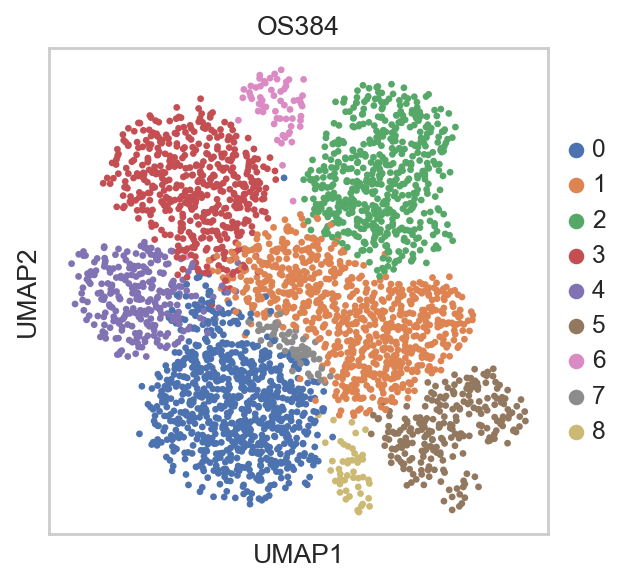

In [12]:
# Setting up the anndata object
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    continuous_covariate_keys=["S_score", "G2M_score", "pct_counts_mt"] #, "percent.mt",  "ccdifference"
)

# creating a model for my adata object
model = scvi.model.SCVI(adata)

# inspecting the structure of the model
model

# training the model
model.train()

# saving my model
#model.save("OS384_scvi_LT_model/")

# loading the model
#model = scvi.model.SCVI.load("/Users/brendamelano/Desktop/scvi/OS384_scvi_LT_model/", adata, use_gpu=False)

# saving the normalized expression in a different layer 
adata.layers["scvi_normalized"] = model.get_normalized_expression(
    library_size=10e4
)

# getting the latent representation
latent = model.get_latent_representation()


# adding the latent variables to the adata object
adata.obsm["X_scVI"] = latent

# using the latent space for umap generation
sc.pp.neighbors(adata, use_rep="X_scVI")


# computing umap
sc.tl.umap(adata, min_dist=1.6)

# clustering using the leiden algorithm
# neighbors were already computed using scVI
sc.tl.leiden(adata, key_added="leiden_scVI", resolution=0.3)


# plotting the clusters
sc.pl.umap(
    adata,
    color=["leiden_scVI"],
    frameon=True,
    title = 'OS384'#,
    #save = "OS384_LT_umap.svg"
)

# SCVelo

In [15]:
#adata = anndata.read_h5ad('/Users/brendamelano/Desktop/scvelo_2/742_data_scvi.h5ad')

# computing the moments
scv.pp.moments(adata, mode = 'distances')
 

# recovering dynamics
scv.tl.recover_dynamics(adata)

# inferring the DYNAMIC velocities
scv.tl.velocity(adata, mode='dynamical')


# computing the velocity graph
scv.tl.velocity_graph(adata)

# creating a dataframe with the cluster IDs
clusters = pd.DataFrame(adata.obs['leiden_scVI'].astype('int64').values)

# Define the number of clusters
n_clusters = len(clusters[0].unique())

# Define a color palette with a limited number of colors
colors = sns.color_palette('pastel', n_clusters)

# Create a dictionary that maps each cluster ID to a color from the palette
cluster_colors = dict(zip(sorted(clusters[0].unique()), colors))

# Map the cluster IDs to their corresponding colors
adata.uns['ClusterName_colors'] = [cluster_colors[c] for c in clusters[0]]

# Set the plot style to 'white' to remove grid lines
sns.set_style('white')

# Plot the stream with the discrete color legend
scv.pl.velocity_embedding_stream(adata, basis='umap', color='leiden_scVI', 
                                 palette=colors, 
                                 title = 'OS384 RNA velocity embedding',
                                 frameon = True)

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/pandas/core/algorithms.py:518: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
recovering dynamics (using 1/12 cores)


/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/1500 [00:00<?, ?gene/s]

KeyError: 'unspliced'

# CellRank

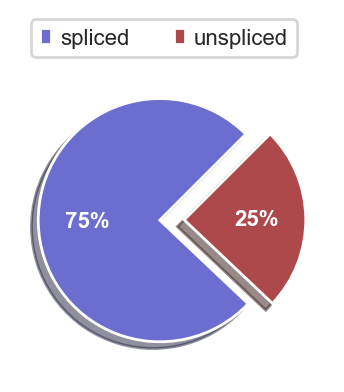

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/3236 [00:00<?, ?cell/s]

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/3236 [00:00<?, ?cell/s]

VelocityKernel[n=3236, model='deterministic', similarity='correlation', softmax_scale=3.447]

In [14]:
# Computing proportions of spliced and unspliced RNA
scv.pl.proportions(adata)

# setting up the velocity kernel
vk = cr.kernels.VelocityKernel(adata)

# compute the transition matrix
vk.compute_transition_matrix()


In [16]:
# combining the velocity and connectivity kernel
ck = cr.kernels.ConnectivityKernel(adata)
ck.compute_transition_matrix()

combined_kernel = 0.8 * vk + 0.2 * ck

In [17]:
g.fit(n_states=4, cluster_key="leiden_scVI")
g.plot_macrostates(which="all")

NameError: name 'g' is not defined

In [18]:
# identifying terminal states with cellrank
cr.tl.terminal_states(adata, cluster_key="leiden_scVI", weight_connectivities=0.2, n_states = 4)

# plotting the terminal states
cr.pl.terminal_states(adata, discrete = True)

# identifying the initial states
cr.tl.initial_states(adata, cluster_key="leiden_scVI")


# visualizing the initial states
cr.pl.initial_states(adata, discrete=True)

AttributeError: module 'cellrank' has no attribute 'tl'

In [19]:
# computing fate maps
cr.tl.lineages(adata)

# performing paga analysis
scv.tl.recover_latent_time(
    adata, root_key="initial_states_probs", end_key="terminal_states_probs"
)

scv.tl.paga(
    adata,
    groups="leiden_scVI",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
    #use_time_prior=False
    
)

cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="leiden_scVI",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=5,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
)

AttributeError: module 'cellrank' has no attribute 'tl'

In [20]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="scvi_normalized",
    genes=["NKX2-5", "NFE2L3", "ZIC2",  "TCF4"],
    ncols=4,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200,
)

AttributeError: module 'cellrank' has no attribute 'ul'

# drivers for cluster 2

In [21]:
# visualizing the lineage drivers
cr.tl.lineage_drivers(adata, lineages='2', use_raw=False, backward=False)

# visualizing the lineage drivers
cluster2_drivers = cr.tl.lineage_drivers(adata, lineages='2', use_raw=False, backward=False)

# filtering for the significant lineage drivers and those with high correlation
trajectory2_drivers = cluster2_drivers[cluster2_drivers["2_pval"] < 0.05]

# filtering for the significant lineage drivers and those with high correlation
trajectory2_corr = trajectory2_drivers[trajectory2_drivers["2_corr"] > 0.2].index

AttributeError: module 'cellrank' has no attribute 'tl'

In [23]:
trajectory2_corr

Index(['TUBA1B', 'HMGB1', 'FABP5', 'H2AZ1', 'CENPN', 'PTTG1', 'FOXM1', 'MZT1',
       'CENPF', 'IPO5',
       ...
       'HELLS', 'LINC02582', 'GPX3', 'CDC45', 'OBI1', 'PRC1', 'FGF1', 'CCDC80',
       'EFNB2', 'NCAM1'],
      dtype='object', name='Gene', length=221)

In [24]:
# reading in the list of transcription factors
transcription_factors = pd.read_csv('/Users/brendamelano/Desktop/transcription_factors.csv', header = None)

transcription_factors

trajectory2_corr[np.in1d(trajectory2_corr, transcription_factors)]

,0
0,AC008770.3
1,AC023509.3
2,AC092835.1
3,AC138696.1
4,ADNP
...,...
1634,ZUFSP
1635,ZXDA
1636,ZXDB
1637,ZXDC


# Drivers for cluster 3

In [36]:
# visualizing the lineage drivers
cr.tl.lineage_drivers(adata, lineages='3', use_raw=False, backward=False)

# visualizing the lineage drivers
cluster3_drivers = cr.tl.lineage_drivers(adata, lineages='3', use_raw=False, backward=False)

# filtering for the significant lineage drivers and those with high correlation
trajectory3_drivers = cluster3_drivers[cluster3_drivers["3_pval"] < 0.05]

# filtering for the significant lineage drivers and those with high correlation
trajectory3_corr = trajectory3_drivers[trajectory3_drivers["3_corr"] > 0.2].index

trajectory3_corr

/var/folders/lt/nhcx288j6jjfg45n3bhh1mjh0000gn/T/ipykernel_4910/2044145963.py:2: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata, lineages='3', use_raw=False, backward=False)
/var/folders/lt/nhcx288j6jjfg45n3bhh1mjh0000gn/T/ipykernel_4910/2044145963.py:5: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cluster3_drivers = cr.tl.lineage_drivers(adata, lineages='3', use_raw=False, backward=False)


In [34]:
# reading in the list of transcription factors
transcription_factors = pd.read_csv('/Users/brendamelano/Desktop/transcription_factors.csv', header = None)

transcription_factors

,0
0,AC008770.3
1,AC023509.3
2,AC092835.1
3,AC138696.1
4,ADNP
...,...
1634,ZUFSP
1635,ZXDA
1636,ZXDB
1637,ZXDC


In [38]:
trajectory3_corr[np.in1d(trajectory3_corr, transcription_factors)]

Index(['PRRX1', 'NR0B1', 'MEOX2', 'ZNF556', 'ZNF560', 'STAT5A'], dtype='object', name='Gene')

# Cluster 0 markers

In [29]:
# visualizing the lineage drivers
cr.tl.lineage_drivers(adata, lineages='0', use_raw=False, backward=False)

# visualizing the lineage drivers
cluster0_drivers = cr.tl.lineage_drivers(adata, lineages='0', use_raw=False, backward=False)

# filtering for the significant lineage drivers and those with high correlation
trajectory0_drivers = cluster0_drivers[cluster0_drivers["0_pval"] < 0.05]

# filtering for the significant lineage drivers and those with high correlation
trajectory0_corr = trajectory0_drivers[trajectory0_drivers["0_corr"] > 0.2].index

/var/folders/lt/nhcx288j6jjfg45n3bhh1mjh0000gn/T/ipykernel_2543/900671855.py:2: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata, lineages='0', use_raw=False, backward=False)


Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)
Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


/var/folders/lt/nhcx288j6jjfg45n3bhh1mjh0000gn/T/ipykernel_2543/900671855.py:5: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cluster0_drivers = cr.tl.lineage_drivers(adata, lineages='0', use_raw=False, backward=False)


In [30]:
trajectory0_corr

Index(['KRT81', 'EPHB6', 'CPA4', 'TNNT1', 'KRT8', 'CALB2', 'ACTG2', 'AQP1',
       'ADGRE1', 'PCSK1N',
       ...
       'EPB41L3', 'GADD45A', 'CD274', 'RIBC2', 'SCIN', 'ESCO2', 'PHLDB2',
       'PLK2', 'AGBL1', 'NDUFA4'],
      dtype='object', name='Gene', length=200)

In [31]:
trajectory0_corr[np.in1d(trajectory0_corr, transcription_factors)]

Index(['TSHZ2', 'NKX2-5', 'MYBL2', 'PPARG', 'SMYD3', 'E2F1', 'E2F8', 'JUN',
       'NFE2L3'],
      dtype='object', name='Gene')

# visualizing top drivers

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: 

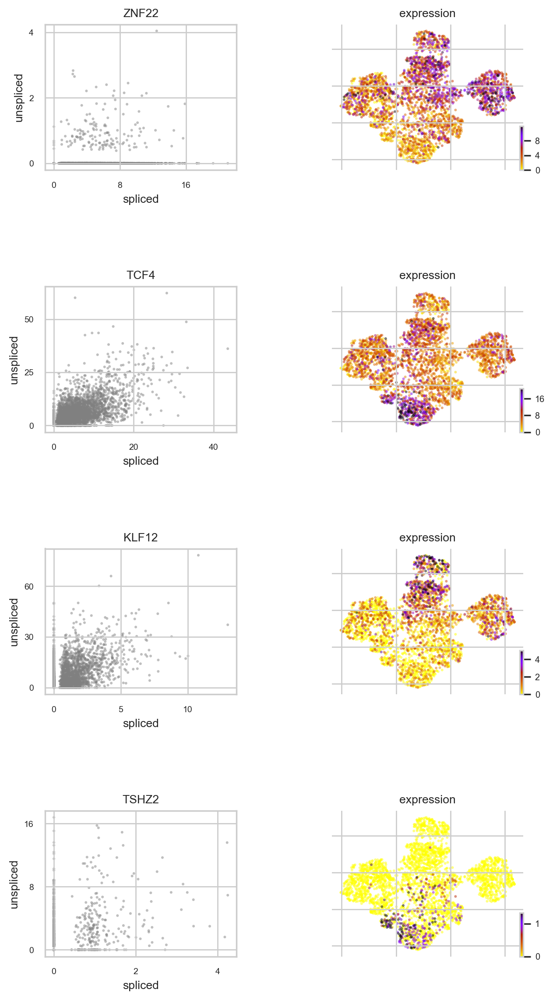

In [26]:
# visualizing the immune modulating markers
scv.pl.velocity(adata, var_names=[ 'ZNF22', 'TCF4', 'KLF12', 'ZIC2', 'TSHZ2'], figsize = (7,7), dpi = 100)

In [53]:
from matplotlib.colors import LinearSegmentedColormap

In [54]:
colors = ["yellow", "purple"]  # You can also use RGB tuples
cmap_name = "yellow_purple"
yellow_purple_cmap = LinearSegmentedColormap.from_list(cmap_name, colors)


In [56]:
plt.register_cmap(cmap=yellow_purple_cmap)


/var/folders/lt/nhcx288j6jjfg45n3bhh1mjh0000gn/T/ipykernel_33078/4133704817.py:1: MatplotlibDeprecationWarning: The register_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps.register(name)`` instead.
  plt.register_cmap(cmap=yellow_purple_cmap)


KeyError: 'NFE2L3'

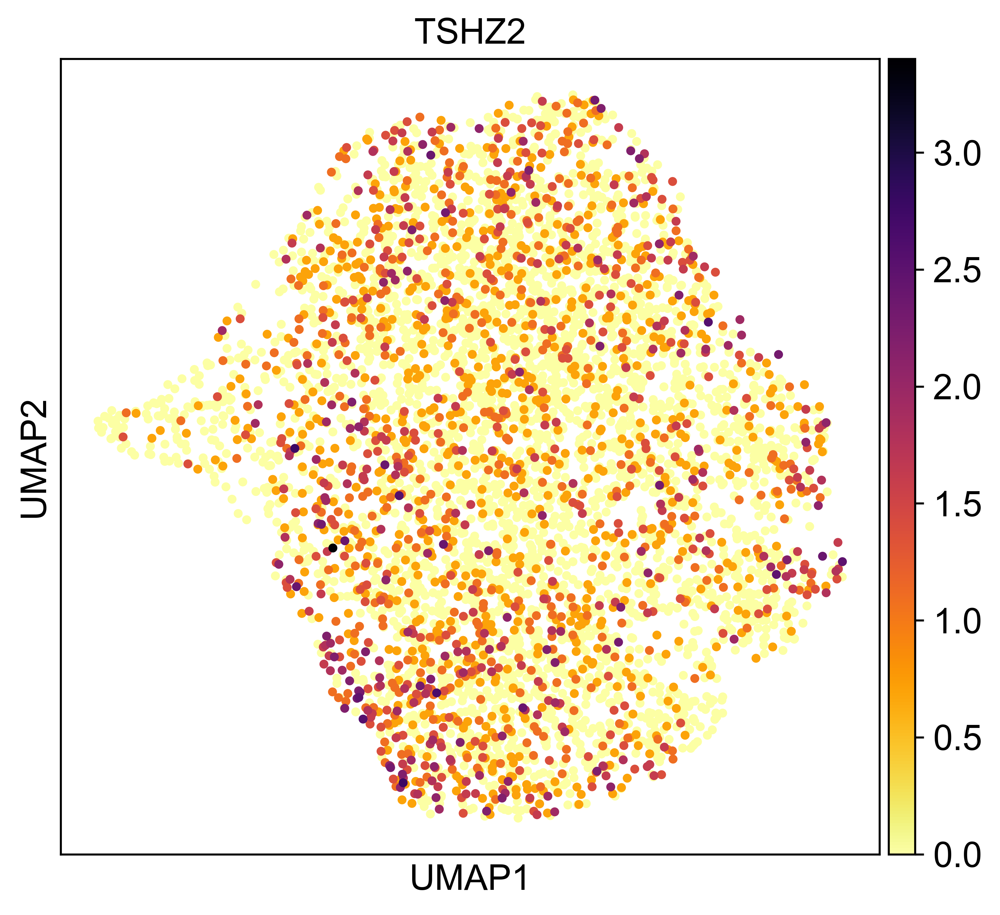

In [3]:
# Assuming you have loaded your annotated data into the 'adata' object

# Set the figure size and DPI
sc.settings.set_figure_params(figsize=(6, 6), dpi=300)

# Plot the UMAP with the expression of the specified genes
sc.pl.umap(adata, color=['TSHZ2', 'NFE2L3',   'NFKB2',  'KLF12', 'SMYD3', 'TCF4'], 
           legend_loc='on data', cmap='inferno_r', 
           size = 50)


#'ZIC2', 'JUNB', DDIT3, NROB1, FOS, STAT1, JUN, 'IRF1','ZIC2',
# enriched in cluster 3 : TCF4, 'KLF12',ZNF22
# other markers , , , , , , 

In [37]:
adata.obs.CCdifference = adata.obs.S_score - adata.obs.G2M_score

/var/folders/lt/nhcx288j6jjfg45n3bhh1mjh0000gn/T/ipykernel_74378/1152555875.py:1: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  adata.obs.CCdifference = adata.obs.S_score - adata.obs.G2M_score


In [38]:
adata.obs.CCdifference

CellID
OS384_inVivo_featureRef:AACTTCTAGTGGCGATx   -0.451407
OS384_inVivo_featureRef:AACCCAATCGAACACTx    0.408605
OS384_inVivo_featureRef:AACTTCTAGACTTCCAx   -0.504658
OS384_inVivo_featureRef:AACCTTTCAATAACGAx   -1.395883
OS384_inVivo_featureRef:AAACCCAAGAGAATCTx   -0.017742
                                               ...   
OS384_inVivo_featureRef:TTTCCTCCATCGCTGGx    0.931783
OS384_inVivo_featureRef:TTTGATCTCTTGAACGx   -0.334204
OS384_inVivo_featureRef:TTTCGATCAGACACAGx   -0.659707
OS384_inVivo_featureRef:TTTCCTCAGACCACGAx   -1.000245
OS384_inVivo_featureRef:TTTCACAGTCGATTTGx    0.226740
Length: 3273, dtype: float64

In [16]:
# visualizing top drivers for cluster 3
scv.pl.velocity(adata, var_names=[ 'NR0B1', 'ZNF556'])


ValueError: Number of rows must be a positive integer, not 0

<Figure size 320x0 with 0 Axes>

/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/brendamelano/opt/anaconda3/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


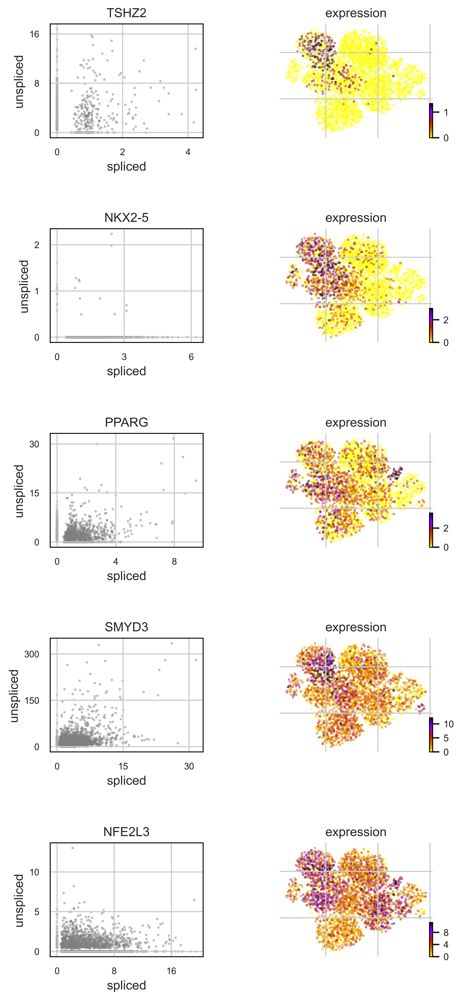

In [33]:
# visualizing the immune modulating markers
scv.pl.velocity(adata, var_names=['TSHZ2', 'NKX2-5', 'PPARG', 'SMYD3', 'JUN',
       'NFE2L3'])

In [47]:
model = cr.ul.models.GAM(adata)

In [51]:
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=["NFE2L3"],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200,
)

  0%|          | 0/1 [00:00<?, ?gene/s]

RuntimeError: Fatal model failure `<FailedModel[origin=GAM[gene='NFE2L3', lineage='4', model=GammaGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, max_iter=2000, scale=None, terms=s(0), tol=0.0001, verbose=False)]]>`.

# Identifying regulons

In [ ]:
import os, glob, re, pickle
from functools import partial
from collections import OrderedDict
import operator as op
from cytoolz import compose

import seaborn as sns
import numpy as np
import anndata as ad
import matplotlib as mpl
import matplotlib.pyplot as plt

from pyscenic.export import export2loom, add_scenic_metadata
from pyscenic.utils import load_motifs
from pyscenic.transform import df2regulons
from pyscenic.aucell import aucell
from pyscenic.binarization import binarize
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_binarization, plot_rss

from IPython.display import HTML, display

In [16]:
# Transcription factors
HUMAN_TFS_FNAME = "/Users/brendamelano/Desktop/scenic/lambert2018.txt"

# ranking databases 
RANKING_DBS_FNAMES = "/Users/brendamelano/Desktop/scenic/genome-ranking.feather"

# motif annotations
MOTIF_ANNOTATIONS_FNAME = "/Users/brendamelano/Desktop/scenic/motifs.tbl"

EXP_MTX_QC_FNAME = "/Users/brendamelano/Desktop/scenic/exp_mtx_qc_fname.csv"

adata.to_df().to_csv("/Users/brendamelano/Desktop/scenic/exp_mtx_qc_fname.csv")

In [31]:
ADJACENCIES_FNAME = "/Users/brendamelano/Desktop/scenic/OS384_LT_adjacencies.tsv"

In [9]:
adjacencies = pd.read_table("/Users/brendamelano/Desktop/scenic/OS384_LT_adjacencies.tsv")

In [10]:
adjacencies

,TF,target,importance
0,FOXM1,DLGAP5,2.249582e+02
1,FOXM1,GTSE1,2.199289e+02
2,FOXM1,BIRC5,2.186103e+02
3,FOXM1,CENPF,2.135005e+02
4,FOXM1,TPX2,2.086606e+02
...,...,...,...
329782,ARNTL,LEKR1,2.520924e-13
329783,CSRNP1,TERT,6.476345e-14
329784,GATA3,CCDC144B,3.625373e-16
329785,FOS,LEKR1,2.162386e-16


In [11]:
cluster_drivering_TF = ['TSHZ2', 'NKX2-5', 'MYBL2', 'PPARG', 'SMYD3', 'E2F1', 'E2F8', 'JUN',
       'NFE2L3']

In [31]:
TSHZ2_targets = adjacencies[adjacencies["TF"] == 'TCF4']["target"]

In [32]:
TSHZ2_targets

# heatmap

sc.pl.heatmap(
    adata, 
    TSHZ2_targets, 
    groupby='leiden_scVI', 
    layer="scvi_normalized",
    standard_scale="var",
    dendrogram=True,
    figsize=(8, 12)
)

213                  LMO7
240                COL4A2
274               ADAMTS6
280                GALNT1
356              SH3PXD2A
               ...       
328039             DCDC2C
328597    ENSG00000238117
328663                C1S
329478               HMSD
329778            SLCO1A2
Name: target, Length: 1930, dtype: object

In [19]:
MOTIFS_FNAME = "/Users/brendamelano/Desktop/scenic/OS384_LT_motifs.tsv"

In [20]:
!pyscenic grn "/Users/brendamelano/Desktop/scenic/exp_mtx_qc_fname.csv" "/Users/brendamelano/Desktop/scenic/lambert2018.txt" -o "/Users/brendamelano/Desktop/scenic/OS384_LT_adjacencies.tsv" --num_workers 4

# for use in wynton
pyscenic grn "/Users/brendamelano/Desktop/scenic/exp_mtx_qc_fname.csv" "/Users/brendamelano/Desktop/scenic/lambert2018.txt" -o "/Users/brendamelano/Desktop/scenic/OS384_LT_adjacencies.tsv" --num_workers 4



2023-03-12 07:27:14,410 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2023-03-12 07:27:14,995 - pyscenic.cli.pyscenic - INFO - Inferring regulatory networks.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
preparing dask client
parsing input
creating dask graph
4 partitions
computing dask graph
not shutting down client, client was created externa

In [54]:
DBS_PARAM = ' '.join(RANKING_DBS_FNAMES)

In [1]:
# predicting the regulons
# my desktop crashes when I run this locally. I rsynced the files to wynton and am running this command on there
# rsynced again to make sure that the motif file was carried over to my desktop
!pyscenic ctx "/Users/brendamelano/Desktop/scenic/OS384_LT_adjacencies.tsv" "/Users/brendamelano/Desktop/scenic/hg19-tss-centered-5kb-10species.mc9nr.genes_vs_motifs.rankings.feather" --annotations_fname "/Users/brendamelano/Desktop/scenic/motifs-v9-nr.hgnc-m0.001-o0.0.tbl" --expression_mtx_fname "/Users/brendamelano/Desktop/scenic/exp_mtx_qc_fname.csv" --output "/Users/brendamelano/Desktop/scenic/OS384_LT_motifs.tsv" --num_workers 8


pyscenic ctx "OS384_LT_adjacencies.tsv" "hg19-tss-centered-5kb-10species.mc9nr.genes_vs_motifs.rankings.feather" --annotations_fname "motifs-v9-nr.hgnc-m0.001-o0.0.tbl" --expression_mtx_fname "exp_mtx_qc_fname.csv" --output "OS384_LT_motifs.tsv" --num_workers 8



2023-03-12 07:14:06,577 - pyscenic.cli.pyscenic - INFO - Creating modules.

2023-03-12 07:14:06,679 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2023-03-12 07:14:07,345 - pyscenic.utils - INFO - Calculating Pearson correlations.

2023-03-12 07:14:07,384 - pyscenic.utils - WARNING - Note on correlation calculation: the default behaviour for calculating the correlations has changed after pySCENIC verion 0.9.16. Previously, the default was to calculate the correlation between a TF and target gene using only cells with non-zero expression values (mask_dropouts=True). The current default is now to use all cells to match the behavior of the R verision of SCENIC. The original settings can be retained by setting 'rho_mask_dropouts=True' in the modules_from_adjacencies function, or '--mask_dropouts' from the CLI.
	Dropout masking is currently set to [False].

2023-03-12 07:14:09,420 - pyscenic.utils - INFO - Creating modules.

2023-03-12 07:14:15,755 - pyscenic.cli.pyscenic - I

In [68]:
RANKING_DBS_FNAMES = list(
                       ['hg19-500bp-upstream-10species.mc9nr.feather',
                       'hg19-tss-centered-5kb-10species.mc9nr.feather',
                        'hg19-tss-centered-10kb-10species.mc9nr.feather'])

In [69]:
DBS_PARAM = ' '.join(RANKING_DBS_FNAMES)

In [70]:
DBS_PARAM

'hg19-500bp-upstream-10species.mc9nr.feather hg19-tss-centered-5kb-10species.mc9nr.feather hg19-tss-centered-10kb-10species.mc9nr.feather'

In [41]:
df = pd.read_table("/Users/brendamelano/Desktop/scenic/OS384_LT_motifs.csv")

In [42]:
df.head()

,Unnamed: 0,Unnamed: 1,Enrichment,Enrichment.1,Enrichment.2,Enrichment.3,Enrichment.4,Enrichment.5,Enrichment.6,Enrichment.7
0,NaN,NaN,AUC,NES,MotifSimilarityQvalue,OrthologousIdentity,Annotation,Context,TargetGenes,RankAtMax
1,TF,MotifID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ARNTL,transfac_pro__M07643,0.10128888769795547,3.0659067487511225,0.000698,1.0,motif similar to taipale__ARNTL_DBD_GTCACGTGAC...,"frozenset({'weight>75.0%', 'hg19-tss-centered-...","[('NR1D1', 1.5134105910092774), ('NFIL3', 8.04...",811
3,ATF3,yetfasco__YER045C_8,0.08171807598885432,3.3378032770741726,0.00098,1.0,gene is annotated for similar motif transfac_p...,"frozenset({'weight>75.0%', 'hg19-tss-centered-...","[('PER2', 1.6080596543939012), ('CREB5', 5.334...",461
4,ATF3,transfac_pro__M07414,0.11094705801116193,5.855412538613166,0.000972,1.0,motif similar to factorbook__CREB ('CREB'; q-v...,"frozenset({'weight>75.0%', 'hg19-tss-centered-...","[('HSPA5', 9.617626013427447), ('CBX4', 9.4161...",506


In [28]:
# loading motifs
df_motifs = load_motifs("/Users/brendamelano/Desktop/scenic/OS384_LT_motifs.csv")
df_motifs.head()

ParserError: Error tokenizing data. C error: Expected 46 fields in line 5, saw 95


In [43]:
def derive_regulons(motifs, db_names=('hg19-tss-centered-10kb-10species', 
                                 'hg19-500bp-upstream-10species', 
                                 'hg19-tss-centered-5kb-10species')):
    motifs.columns = motifs.columns.droplevel(0)

    def contains(*elems):
        def f(context):
            return any(elem in context for elem in elems)
        return f

    # For the creation of regulons we only keep the 10-species databases and the activating modules. We also remove the
    # enriched motifs for the modules that were created using the method 'weight>50.0%' (because these modules are not part
    # of the default settings of modules_from_adjacencies anymore.
    motifs = motifs[
        np.fromiter(map(compose(op.not_, contains('weight>50.0%')), motifs.Context), dtype=np.bool) & \
        np.fromiter(map(contains(*db_names), motifs.Context), dtype=np.bool) & \
        np.fromiter(map(contains('activating'), motifs.Context), dtype=np.bool)]

    # We build regulons only using enriched motifs with a NES of 3.0 or higher; we take only directly annotated TFs or TF annotated
    # for an orthologous gene into account; and we only keep regulons with at least 10 genes.
    regulons = list(filter(lambda r: len(r) >= 10, df2regulons(motifs[(motifs['NES'] >= 3.0) 
                                                                      & ((motifs['Annotation'] == 'gene is directly annotated')
                                                                        | (motifs['Annotation'].str.startswith('gene is orthologous to')
                                                                           & motifs['Annotation'].str.endswith('which is directly annotated for motif')))
                                                                     ])))
    
    # Rename regulons, i.e. remove suffix.
    return list(map(lambda r: r.rename(r.transcription_factor), regulons))

In [46]:
selected_motifs = ['NR0B1','TSHZ2','NKX2-5']
df_motifs_sel = df.iloc[ [ True if x in selected_motifs else False for x in df.index.get_level_values('TF') ] ,:]


KeyError: 'Requested level (TF) does not match index name (None)'

In [47]:
regulons = derive_regulons(df)

ValueError: Cannot remove 1 levels from an index with 1 levels: at least one level must be left.

# Producing pseudobulk data for CiberATAC

In [11]:
import pyranges as pr
import requests
import pandas as pd

# creating a dataframe with the cluster IDs
clusters = pd.DataFrame(adata.obs['leiden_scVI'].values)


# Create an empty DataFrame to store the average expression values
avg_expression_df = pd.DataFrame(index=adata.var_names)


# subsetting a dataframe to only contain cells from a certain cluster
cluster_data = adata[adata.obs['leiden_scVI'] == '0']


# creating an array with the expression from that dataframe
cluster_expression = cluster_data.X


# Taking the mean expresison of each gene for the cells in this cluster
avg_expression = np.mean(cluster_expression, axis=0)

avg_expression


Index(['NOC2L', 'C1orf159', 'CCNL2', 'PANK4', 'LRRC47', 'GPR153', 'CLSTN1',
       'NPPB', 'EMC1', 'TMCO4',
       ...
       'FAM133A', 'BEX4', 'RADX', 'PAK3', 'ENSG00000230392', 'SPANXB1', 'FMR1',
       'MTM1', 'BGN', 'EMD'],
      dtype='object', name='Gene', length=1500)

In [1]:
import pyBigWig

In [12]:
target_url='http://hgdownload.cse.ucsc.edu/goldenPath/hg38/bigZips/hg38.chrom.sizes'
chromsizes=pd.read_csv(target_url, sep='\t', header=None)
chromsizes.columns=['Chromosome', 'End']
chromsizes['Start']=[0]*chromsizes.shape[0]
chromsizes=chromsizes.loc[:,['Chromosome', 'Start', 'End']]

In [ ]:
bw = pyBigWig.open('~/Desktop/output_cluster_0.bw', 'w')

chromsizes

# generating the pseudobulk bigWig files

# mapping genes back onto genome coordinates


In [ ]:
# generating the VAE_mu matrix from the single cell data